In [2]:
import warnings
warnings.simplefilter(action='ignore')

In [3]:
import scanpy as sc
import scarches as sca
import matplotlib.pyplot as plt
import numpy as np

import sys
sys.path.insert(0, '../')
import scripts.annotation_transfer_utils as atu

In [14]:
sc.set_figure_params(dpi=200, frameon=False, figsize=(4, 4))

## load data and pretrained model

In [5]:
adata = sc.read('./covid_kang_pbmc_integrated_le.h5ad')

In [6]:
adata

AnnData object with n_obs × n_vars = 64812 × 1972
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue', 'batch2', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'seurat_annotations', 'integrated_snn_res.0.5', 'seurat_clusters', 'condition', 'cell_type', 'batch_join', 'cell_type_joint', 'source', 'source2', 'celltype'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable_nbatches-0', 'highly_variable_intersection-0', 'ENS-0-1'
    uns: 'batch_colors', 'cell_type_joint_colors', 'neighbors', 'source2_colors', 'study_colors', 'terms', 'umap'
    obsm: 'X_cvae', 'X_umap'
    obsp: 'connectivities', 'distances'

In [7]:
model = sca.models.TRVAE.load("./cvae_kang_covid_query/", adata)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 256 6
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 282
Encoder Architecture:
	Input Layer in, out and cond: 1972 128 6
	Mean/Var Layer in/out: 128 1
Decoder Architecture:
	Masked linear layer in, out and cond:  282 1972 6


# overall visualization

IFN+ctrl

In [312]:
d1 = adata[adata.obs.source.isin(["control", "INF-Beta"])]

In [336]:
sc.tl.rank_genes_groups(d1, groupby="celltype")

Trying to set attribute `.uns` of view, copying.


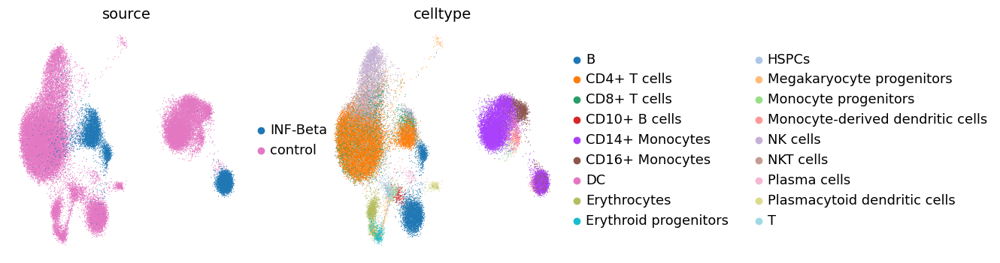

In [461]:
sc.pl.umap(d1, color=["source", "celltype"])

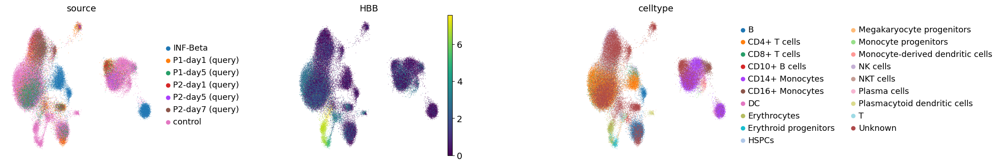

In [462]:
sc.pl.umap(adata, color=["source", "HBB", "celltype"], wspace=0.7)

### normalizing  the raw data 

In [47]:
adata_raw = adata.raw.to_adata()

In [51]:
adata_raw.X = np.nan_to_num(adata_raw.X)

In [53]:
sc.pp.normalize_per_cell(adata_raw)
sc.pp.log1p(adata_raw)

In [54]:
adata.raw = adata_raw 

In [57]:
ref = adata[adata.obs.source.isin(["INF-Beta", "control"])]
query = adata[~adata.obs.source.isin(["INF-Beta", "control"])]

In [384]:
sc.pp.neighbors(query, use_rep="X_cvae", n_neighbors=10)

In [385]:
sc.tl.umap(query)

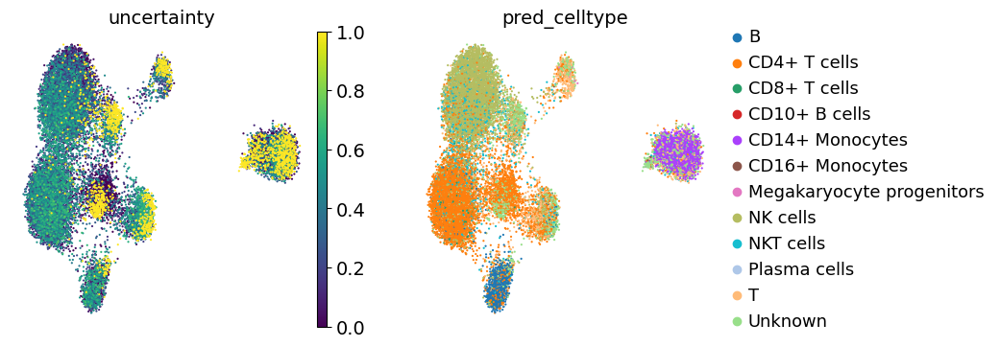

In [389]:
sc.pl.umap(query,  color=['uncertainty', "pred_celltype"], frameon=False,  size=10)

In [393]:
sc.tl.leiden(query, resolution=1.1)

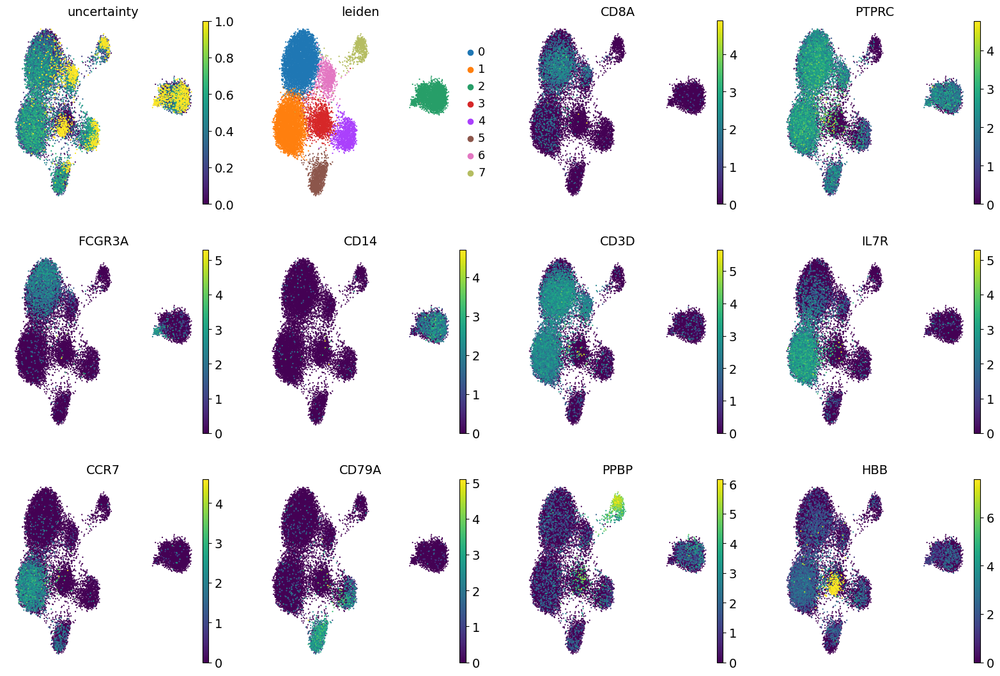

In [405]:
sc.pl.umap(query,  color=['uncertainty',"leiden",
                          "CD8A","PTPRC",
                          "FCGR3A",
                         "CD14","CD3D", "IL7R", "CCR7"
                          , "CD79A", "PPBP", "HBB"], frameon=False,  size=10)

In [472]:
query.obs.celltype = "NA"
query.obs.celltype[query.obs.leiden == "0"] = "CD8T-NK"
query.obs.celltype[query.obs.leiden == "1"] = "CD4+ T cells"
query.obs.celltype[query.obs.leiden == "2"] = "Monocytes"
query.obs.celltype[query.obs.leiden == "3"] = "Erythrocytes"
query.obs.celltype[query.obs.leiden == "4"] = "Plasma B"
query.obs.celltype[query.obs.leiden == "5"] = "B"
query.obs.celltype[query.obs.leiden == "6"] = "CD8+ T cells"
query.obs.celltype[query.obs.leiden == "7"] = "Platelets"



In [469]:
sc.tl.leiden(query, resolution=0.6, restrict_to=("leiden", ["2"]))

... storing 'celltype' as categorical


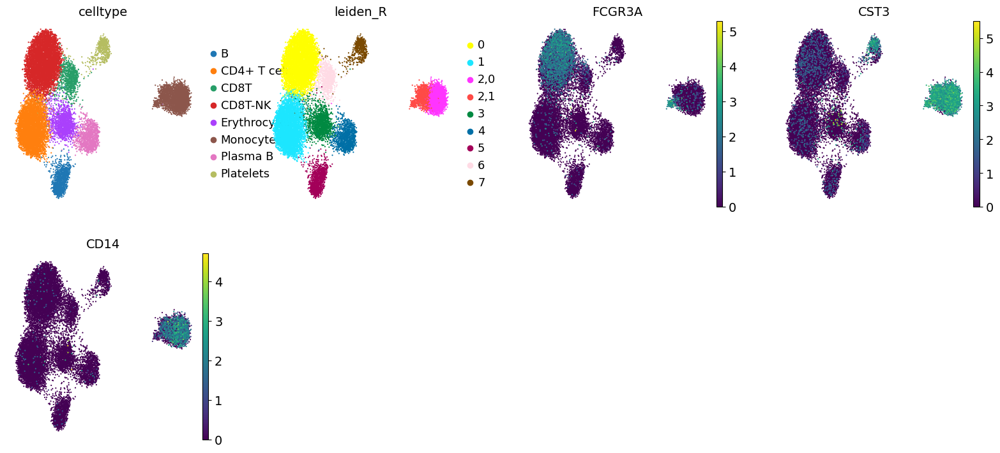

In [470]:
sc.pl.umap(query,  color=['celltype',"leiden_R","FCGR3A","CST3", "CD14"], frameon=False,  size=10)

In [473]:
query.obs.celltype[(query.obs.leiden == "2") & (query.raw[:, "FCGR3A"].X >= 1.5).flatten()] = "CD16+ Monocytes"
query.obs.celltype[(query.obs.leiden == "2") & (query.raw[:, "FCGR3A"].X < 1.5).flatten()] = "CD14+ Monocytes"


... storing 'celltype' as categorical


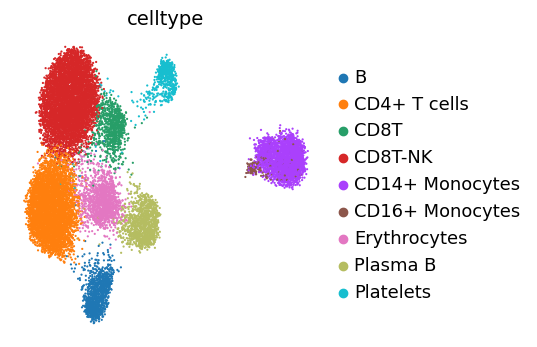

In [474]:
sc.pl.umap(query,  color=['celltype'], frameon=False,  size=10)

In [477]:
sc.tl.leiden(query, resolution=0.6, restrict_to=("leiden", ["0"]))

In [ ]:
sc.pl.umap(query,  color=["leiden_R","CD3D","CD8A",
                          "FCGR3A", "CCR7","IL7R",'celltype',"CD40LG"], frameon=False,  size=10)

In [493]:
query.obs.celltype = list(query.obs.celltype)

In [494]:
query.obs.celltype[(query.obs.leiden_R == "0,0")] = "CD8+ T cells"
query.obs.celltype[(query.obs.leiden_R == "0,1")] = "NK cells"


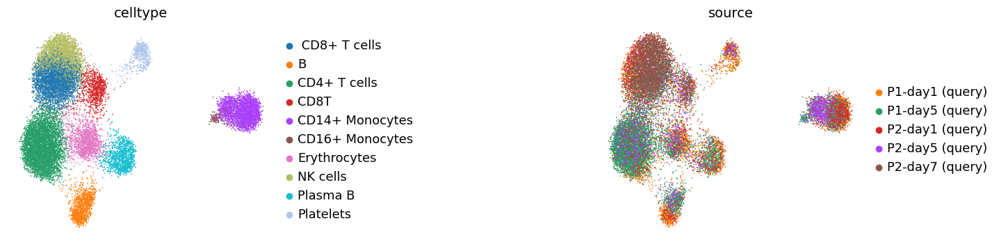

In [488]:
sc.pl.umap(query, color=["celltype", "source"], wspace=1)

merging ref and query 

In [497]:
adata_new = ref.concatenate(query, batch_key="batch_union")

In [498]:
adata.obs.celltype.cat.categories

Index(['B', 'CD4+ T cells', 'CD8+ T cells', 'CD10+ B cells', 'CD14+ Monocytes',
       'CD16+ Monocytes', 'DC', 'Erythrocytes', 'Erythroid progenitors',
       'HSPCs', 'Megakaryocyte progenitors', 'Monocyte progenitors',
       'Monocyte-derived dendritic cells', 'NK cells', 'NKT cells',
       'Plasma cells', 'Plasmacytoid dendritic cells', 'T', 'Unknown'],
      dtype='object')

In [509]:
sc.pp.neighbors(adata_new, use_rep="X_cvae")

In [511]:
sc.tl.umap(adata_new)

In [ ]:
sc.pl.umap(adata_new, color=["celltype", "source"], wspace=1.3)

In [516]:
# adata_new.write("ref_query_anotated.h5ad")

In [54]:
adata = sc.read("ref_query_anotated.h5ad")

## Diffetential enrichment analysis with expmap

In [32]:
sc.set_figure_params(dpi=150, frameon=False, figsize=(4, 4))

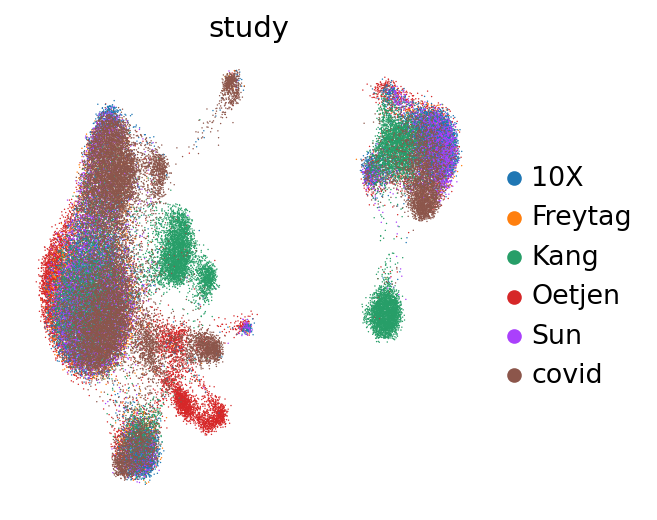

In [44]:
sc.pl.umap(adata, color=["study"], wspace=0.9)

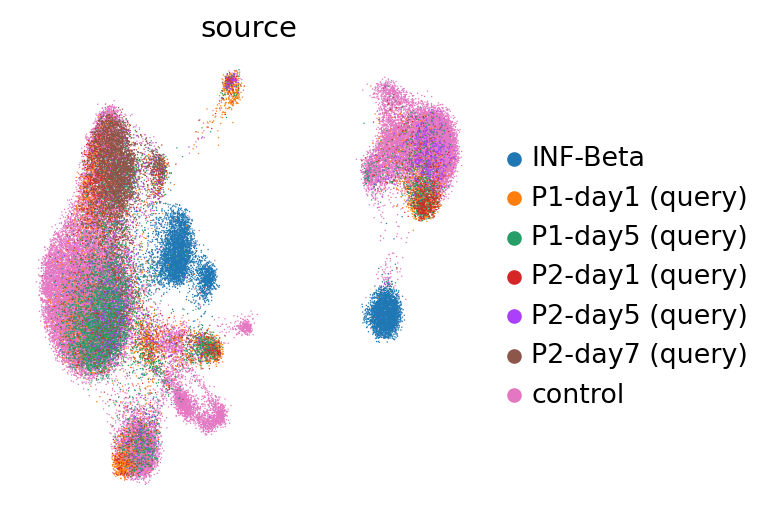

In [33]:
sc.pl.umap(adata, color=["source"], wspace=0.9)

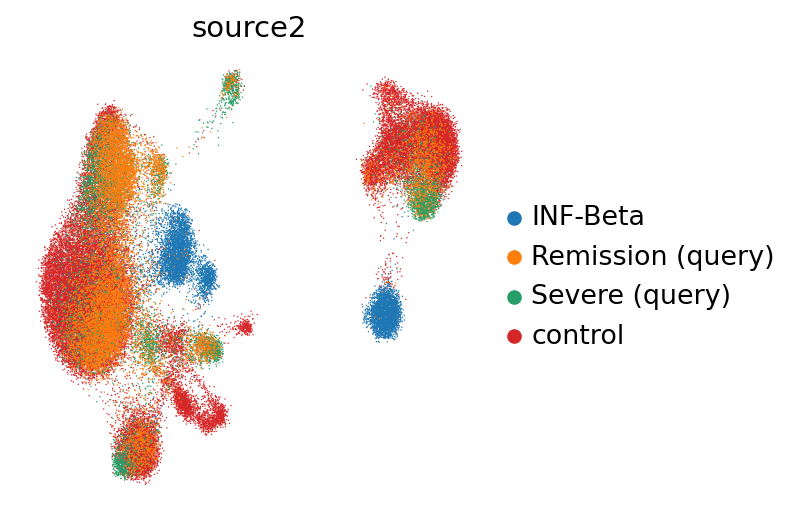

In [287]:
sc.pl.umap(adata, color=["source2"], wspace=0.9)

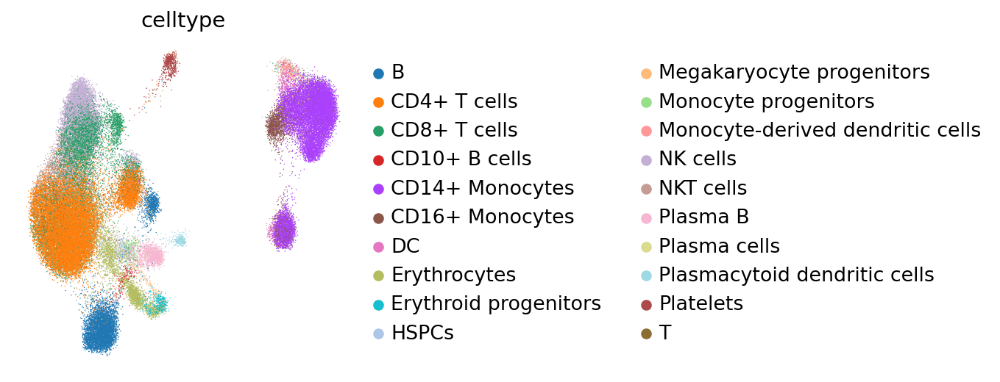

In [34]:
sc.pl.umap(adata, color=["celltype"], wspace=0.9)

In [35]:
#check cell types in the query data 

In [42]:
ct = ['B', 'CD4+ T cells', 'CD8+ T cells', 'CD14+ Monocytes',
       'CD16+ Monocytes', 'Erythrocytes','NK cells',
       'Plasma B', "Platelets"]

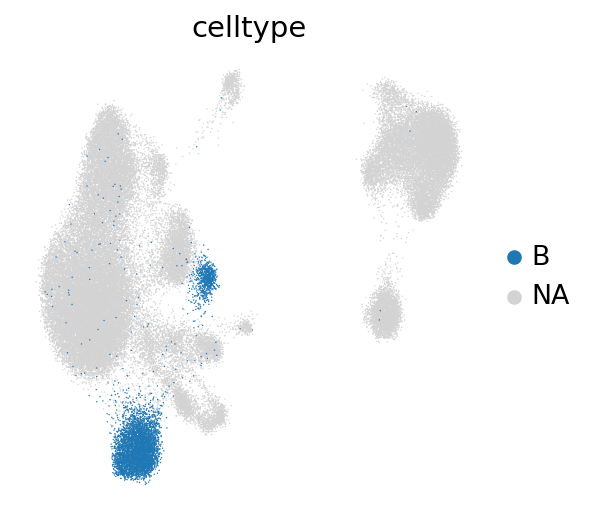

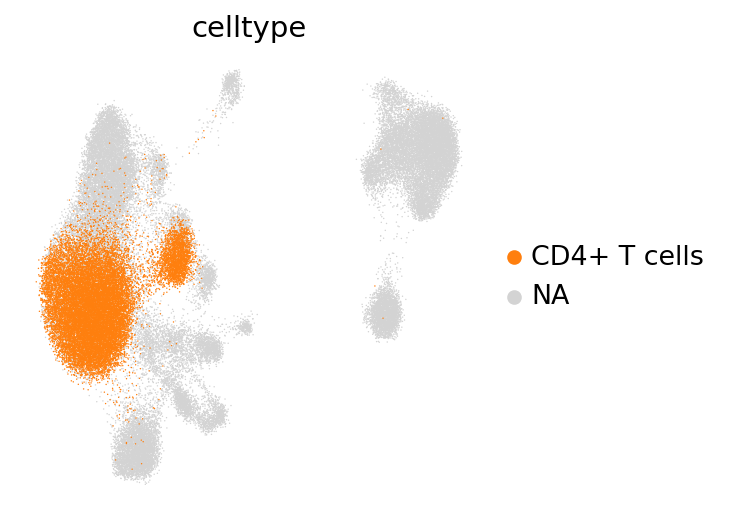

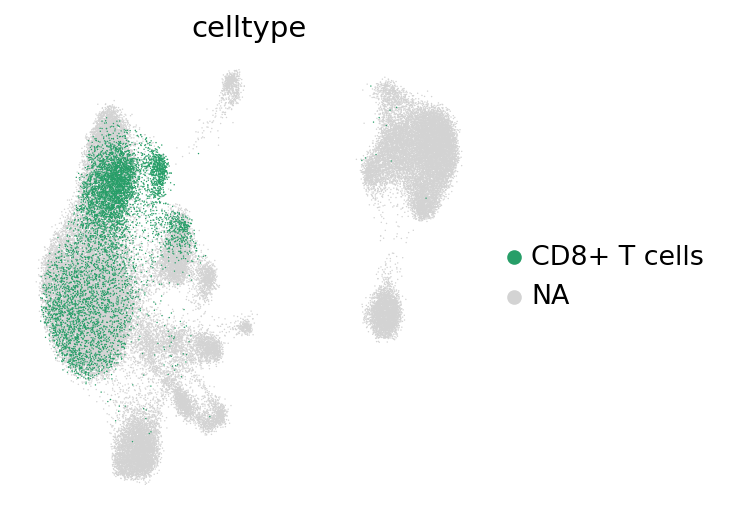

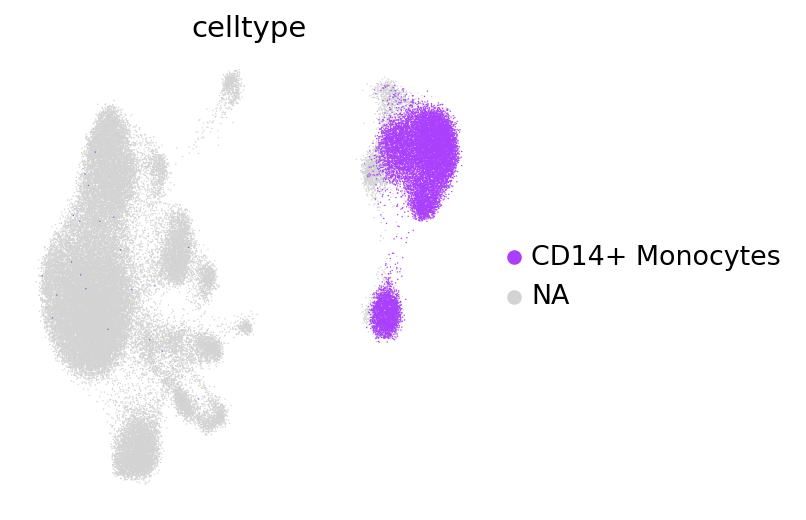

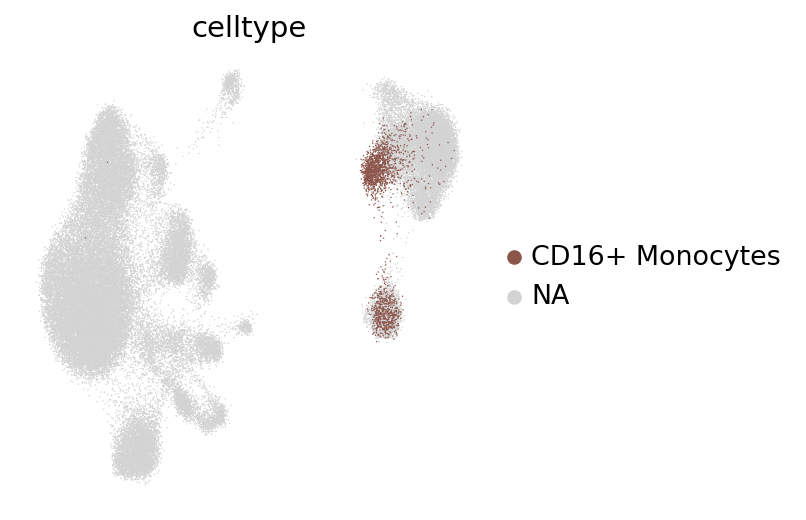

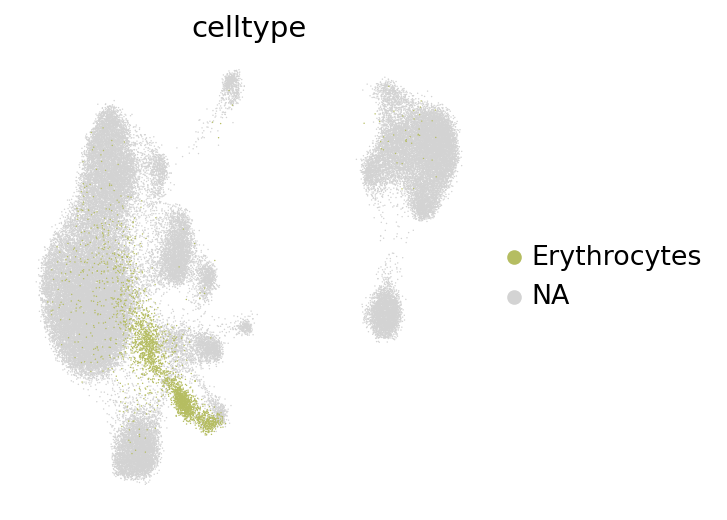

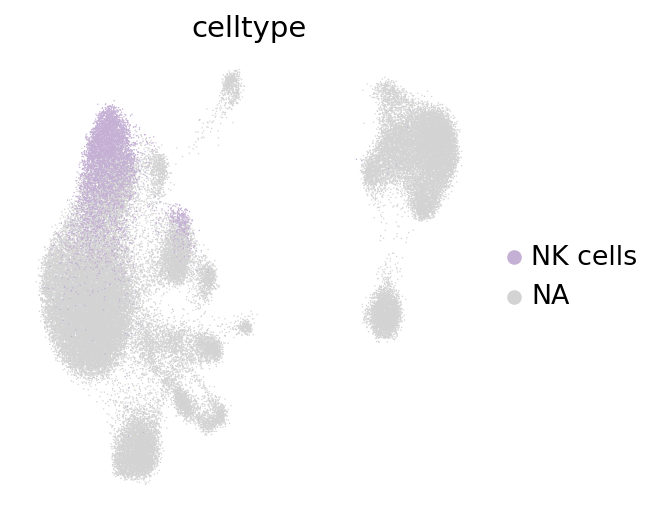

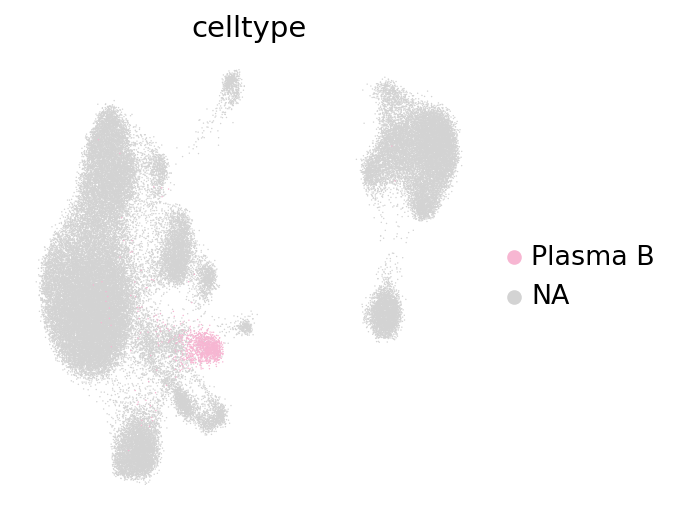

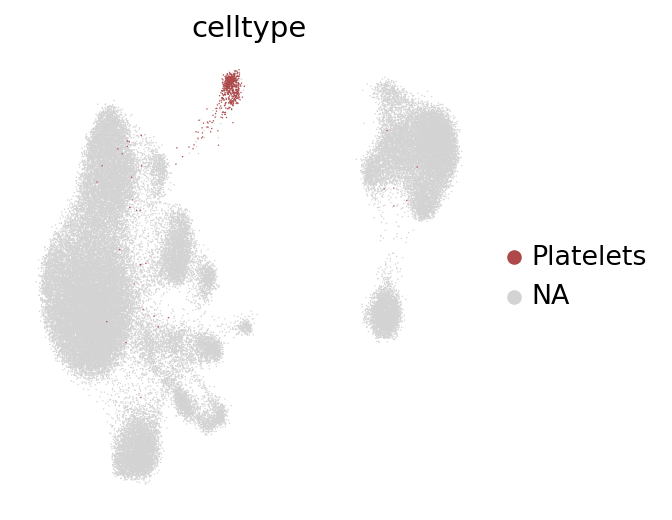

In [43]:
for i in ct :
    sc.pl.umap(adata, color=["celltype"], groups=[i])

pathway analysis 

In [58]:
inactive_idx = ~(model.model.decoder.L0.expr_L.weight.data.norm(p=2, dim=0)>0).cpu().numpy()
[term for i, term in enumerate(adata.uns['terms']) if inactive_idx[i]]

['PYRUVATE_METABOLISM_AND_CITRIC',
 'DAG_AND_IP3_SIGNALING',
 'GROWTH_HORMONE_RECEPTOR_SIGNAL',
 'NEF_MEDIATES_DOWN_MODULATION_O',
 'O_LINKED_GLYCOSYLATION_OF_MUCI',
 'SPHINGOLIPID_DE_NOVO_BIOSYNTHE',
 'NUCLEAR_SIGNALING_BY_ERBB4',
 'ACTIVATED_NOTCH1_TRANSMITS_SIG',
 'RORA_ACTIVATES_CIRCADIAN_EXPRE',
 'YAP1_AND_WWTR1_TAZ_STIMULATED_',
 'EXTRACELLULAR_MATRIX_ORGANIZAT',
 'CIRCADIAN_REPRESSION_OF_EXPRES',
 'SIGNALLING_TO_RAS',
 'HEPARAN_SULFATE_HEPARIN_HS_GAG',
 'SIGNALING_BY_FGFR_MUTANTS',
 'BASIGIN_INTERACTIONS',
 'ERK_MAPK_TARGETS',
 'TRANSPORT_OF_MATURE_TRANSCRIPT',
 'NRAGE_SIGNALS_DEATH_THROUGH_JN',
 'REGULATION_OF_APOPTOSIS',
 'PHASE1_FUNCTIONALIZATION_OF_CO',
 'CA_DEPENDENT_EVENTS',
 'G1_PHASE',
 'P53_DEPENDENT_G1_DNA_DAMAGE_RE',
 'RNA_POL_II_TRANSCRIPTION_PRE_I',
 'NUCLEOTIDE_EXCISION_REPAIR',
 'CLASS_B_2_SECRETIN_FAMILY_RECE',
 'FORMATION_OF_RNA_POL_II_ELONGA',
 'G_BETA_GAMMA_SIGNALLING_THROUG',
 'CELL_JUNCTION_ORGANIZATION',
 'PI_3K_CASCADE',
 'TAK1_ACTIVATES_NFKB_BY_PHOSPHO',


In [61]:
adata.uns['active_terms'] = np.array(adata.uns['terms'])[model.model.decoder.nonzero_terms()]

In [65]:
directions = model._latent_directions(method="sum")
adata.obsm['X_cvae'] *= directions[model.model.decoder.nonzero_terms()]

In [82]:
adata.obs.source.value_counts()

control            38843
INF-Beta            7217
P1-day5 (query)     6980
P1-day1 (query)     4672
P2-day7 (query)     3332
P2-day1 (query)     2280
P2-day5 (query)     1488
Name: source, dtype: int64

In [100]:
scores_cond = model.latent_enrich('celltype',adata=adata, directions=directions,n_perm=5000)

In [103]:
path_ways_cond = filter_set_scores(scores_cond, adata, filter_v=1.8)

In [120]:
np.sum(ct_adata.obs.source == "control")

0

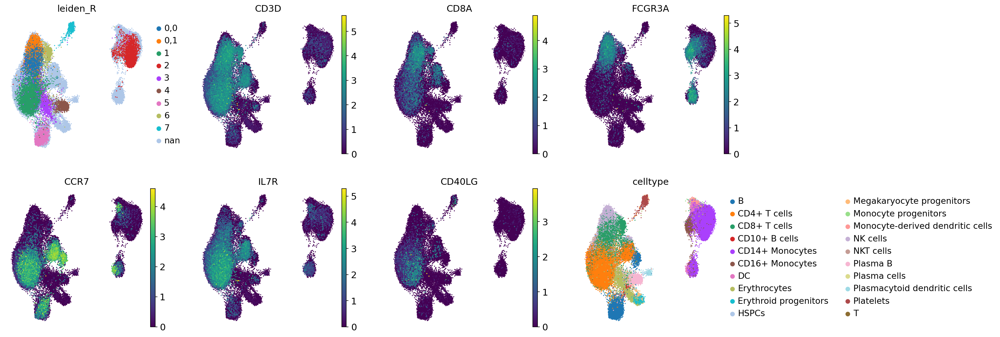

In [328]:
sc.pl.umap(adata,  color=["leiden_R","CD3D","CD8A",
                          "FCGR3A", "CCR7","IL7R","CD40LG",'celltype'], frameon=False,  size=10)

In [171]:
ct_pathway = {}
ct_pathway_adata = {}
for i in ct:
    ct_pathway_adata[i] =  adata[adata.obs.celltype == i]
    if np.sum(ct_pathway_adata[i].obs.source == "control")>10:
        scores_cond = model.latent_enrich('source2',comparison="control", adata=ct_pathway_adata[i],n_perm=10000)
        ct_pathway[i] = filter_set_scores(scores_cond, ct_pathway_adata[i], filter_v=0.5)
    else:
        print(f"no control cells in {i}")

        ct_pathway[i] = "no_control"

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


no control cells in Plasma B
no control cells in Platelets


##  Pathway analysis for specific cell types 

In [212]:
ct_pathway["CD8+ T cells"]

{'terms': array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
        'ADAPTIVE_IMMUNE_SYSTEM', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'METABOLISM_OF_MRNA', 'GPCR_LIGAND_BINDING',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'METABOLISM_OF_RNA',
        'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CLASS_I_MHC_MEDIATED_ANTIGEN_P',
        'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_GPCR',
        'METABOLISM_OF_AMINO_ACIDS_AND_', 'GENERIC_TRANSCRIPTION_PATHWAY',
        'METABOLISM_OF_PROTEINS', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
        'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'MUSCLE_CONTRACTION',
        'DIABETES_PATHWAYS', 'GPCR_DOWNSTREAM_SIGNALING',
        'CELL_SURFACE_INTERACTIONS_AT_T', 'METABOLISM_OF_CARBOHYDRATES',
        'IMMUNE_SYSTEM', 'TCR_SIGNALING'], dtype=object),
 'scores': array([ 4.39,  4.25,  2.65,  1.86, -1.76, -1.54, -1.28, -1.28,  1.02,
        -1.01, -0.99,  0.94,  0.9 ,  0.85, -0.8 , -0.74, -0.67, -0.67,
         0.65, -0.64,  0.6 , -0.56,  0.52, -0.51])}

In [219]:
ct_pathway["CD8+ T cells"].keys()

dict_keys(['INF-Beta', 'Severe (query)', 'Remission (query)'])

In [333]:
ct_pathway["CD8+ T cells"]['Remission (query)']

{'terms': array(['METABOLISM_OF_MRNA', 'METABOLISM_OF_RNA',
        'PLATELET_ACTIVATION_SIGNALING_', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'SIGNALING_BY_GPCR',
        'IMMUNOREGULATORY_INTERACTIONS_', 'TRANSMEMBRANE_TRANSPORT_OF_SMA',
        'METABOLISM_OF_PROTEINS', 'GENERIC_TRANSCRIPTION_PATHWAY',
        'ADAPTIVE_IMMUNE_SYSTEM', 'MHC_CLASS_II_ANTIGEN_PRESENTAT',
        'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'GPCR_LIGAND_BINDING',
        'PEPTIDE_LIGAND_BINDING_RECEPTO', 'INNATE_IMMUNE_SYSTEM',
        'GPCR_DOWNSTREAM_SIGNALING', 'INTERFERON_SIGNALING',
        'TRIF_MEDIATED_TLR3_SIGNALING', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
        'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_ILS',
        'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'AXON_GUIDANCE',
        'CELL_SURFACE_INTERACTIONS_AT_T', 'CELL_CYCLE',
        'RESPONSE_TO_ELEVATED_PLATELET_', 'APOPTOSIS',
        'CELL_CYCLE_MITOTIC', 'SRP_DEPENDENT_COTRANSLATIONAL_'],
       dtype=object),
 'sco

In [329]:
ct_pathway["CD8+ T cells"]['Remission (query)']["terms"]

array(['METABOLISM_OF_MRNA', 'METABOLISM_OF_RNA',
       'PLATELET_ACTIVATION_SIGNALING_', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
       'SIGNALING_BY_TGF_BETA_RECEPTOR', 'SIGNALING_BY_GPCR',
       'IMMUNOREGULATORY_INTERACTIONS_', 'TRANSMEMBRANE_TRANSPORT_OF_SMA',
       'METABOLISM_OF_PROTEINS', 'GENERIC_TRANSCRIPTION_PATHWAY',
       'ADAPTIVE_IMMUNE_SYSTEM', 'MHC_CLASS_II_ANTIGEN_PRESENTAT',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'GPCR_LIGAND_BINDING',
       'PEPTIDE_LIGAND_BINDING_RECEPTO', 'INNATE_IMMUNE_SYSTEM',
       'GPCR_DOWNSTREAM_SIGNALING', 'INTERFERON_SIGNALING',
       'TRIF_MEDIATED_TLR3_SIGNALING', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
       'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_ILS',
       'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'AXON_GUIDANCE',
       'CELL_SURFACE_INTERACTIONS_AT_T', 'CELL_CYCLE',
       'RESPONSE_TO_ELEVATED_PLATELET_', 'APOPTOSIS',
       'CELL_CYCLE_MITOTIC', 'SRP_DEPENDENT_COTRANSLATIONAL_'],
      dtype=object)

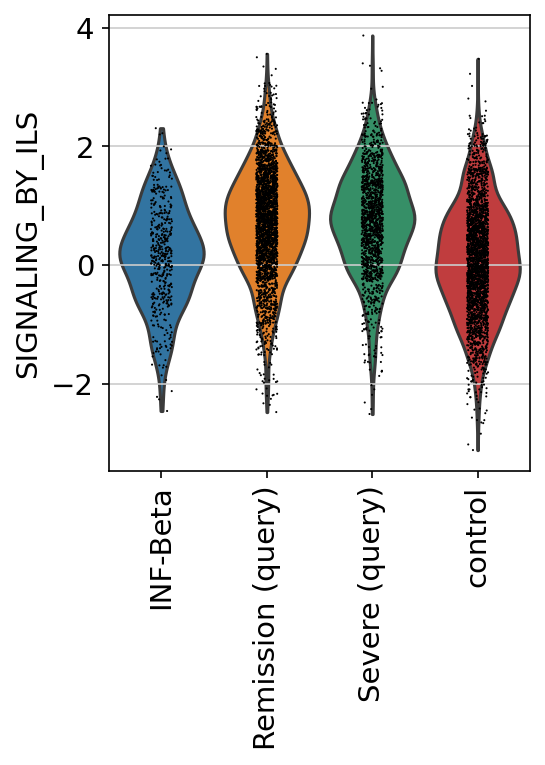

In [341]:
sc.pl.violin(ct_pathway_adata['CD8+ T cells'], 
                     keys="SIGNALING_BY_ILS"
                     ,groupby="source2", rotation=90)

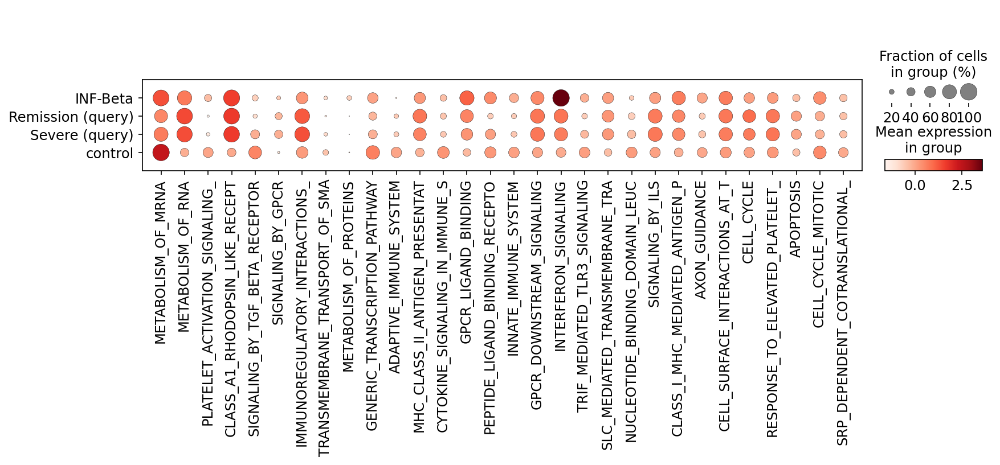

In [286]:
sc.pl.dotplot(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]['Remission (query)']["terms"]
                     ,groupby="source2")

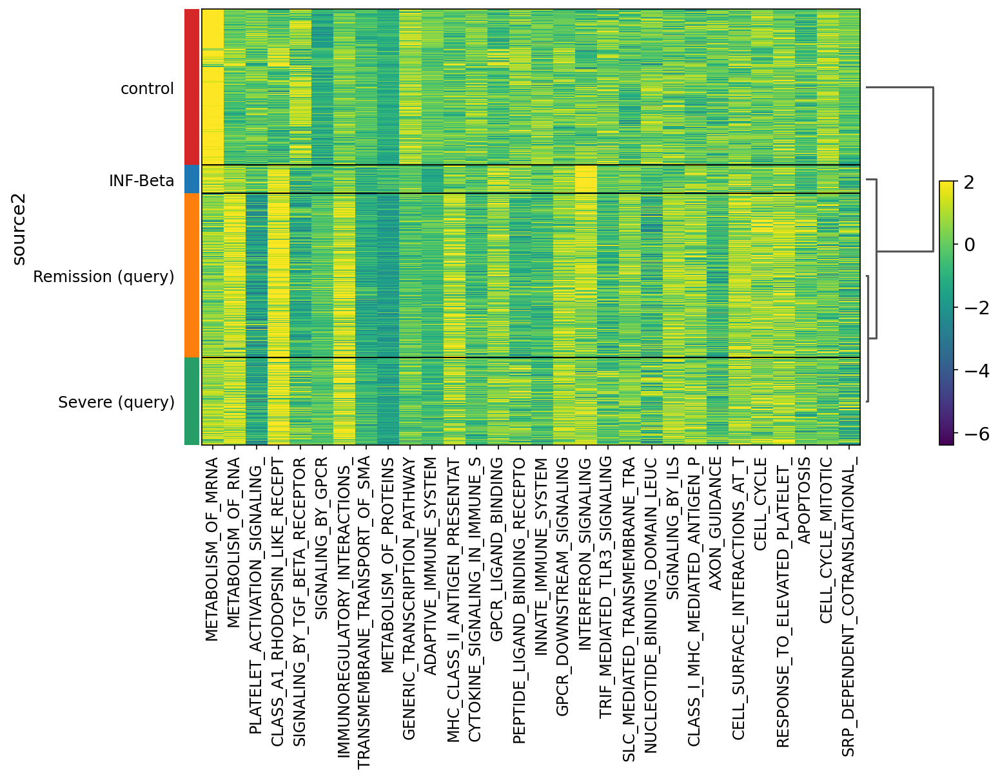

In [282]:
sc.pl.heatmap(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]['Remission (query)']["terms"]
                     ,groupby="source2", vmax=2,dendrogram=True, )

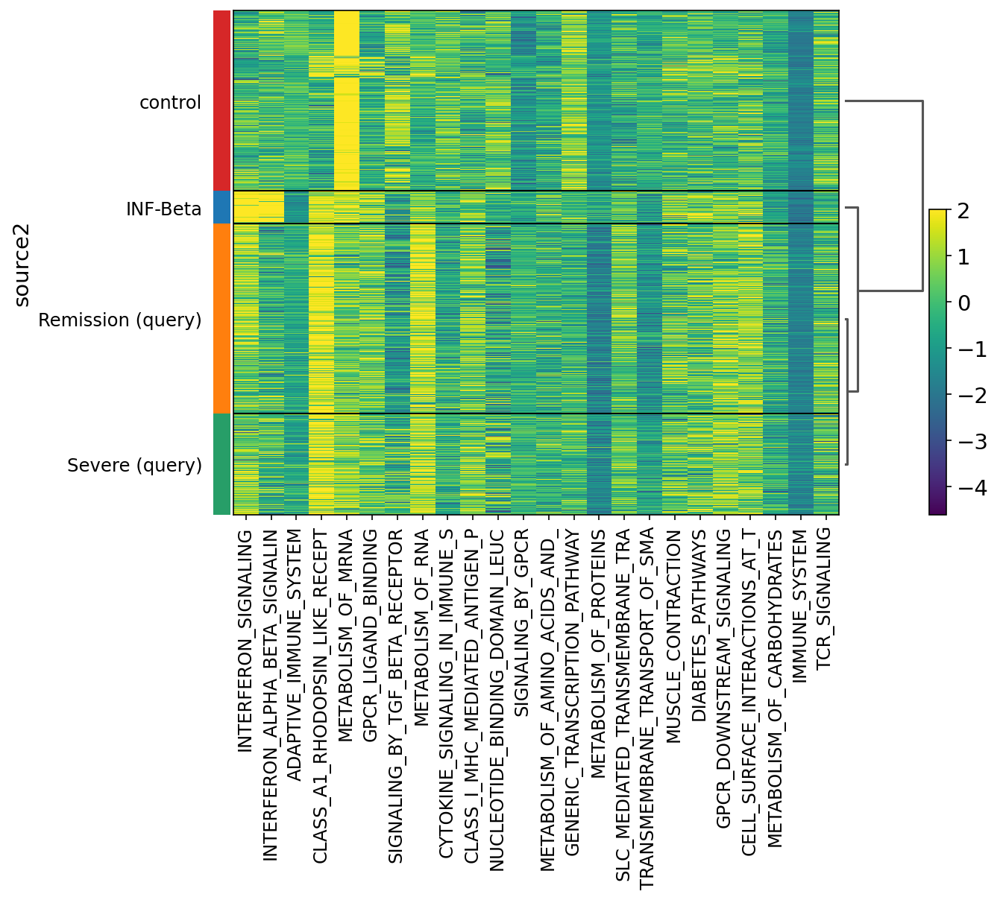

In [280]:
sc.pl.heatmap(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]["INF-Beta"]["terms"]
                     ,groupby="source2", vmax=2,dendrogram=True)

In [343]:
ct_pathway["CD8+ T cells"]["INF-Beta"]

{'terms': array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
        'ADAPTIVE_IMMUNE_SYSTEM', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'METABOLISM_OF_MRNA', 'GPCR_LIGAND_BINDING',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'METABOLISM_OF_RNA',
        'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CLASS_I_MHC_MEDIATED_ANTIGEN_P',
        'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_GPCR',
        'METABOLISM_OF_AMINO_ACIDS_AND_', 'GENERIC_TRANSCRIPTION_PATHWAY',
        'METABOLISM_OF_PROTEINS', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
        'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'MUSCLE_CONTRACTION',
        'DIABETES_PATHWAYS', 'GPCR_DOWNSTREAM_SIGNALING',
        'CELL_SURFACE_INTERACTIONS_AT_T', 'METABOLISM_OF_CARBOHYDRATES',
        'IMMUNE_SYSTEM', 'TCR_SIGNALING'], dtype=object),
 'scores': array([ 4.39,  4.25,  2.65,  1.86, -1.76, -1.54, -1.28, -1.28,  1.02,
        -1.01, -0.99,  0.94,  0.9 ,  0.85, -0.8 , -0.74, -0.67, -0.67,
         0.65, -0.64,  0.6 , -0.56,  0.52, -0.51])}

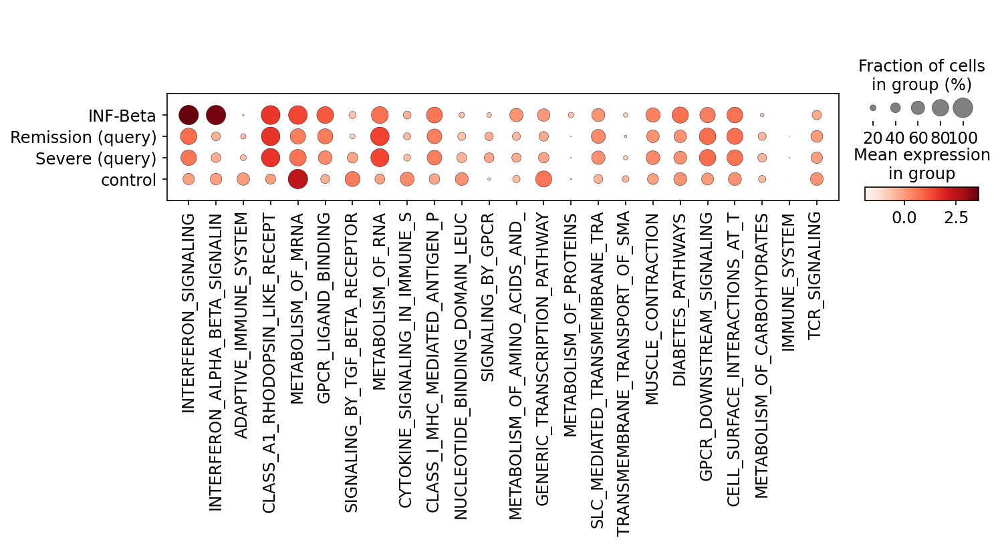

In [235]:
sc.pl.dotplot(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]["INF-Beta"]["terms"]
                     ,groupby="source2")

In [348]:
ct_pathway["CD8+ T cells"]["INF-Beta"]

{'terms': array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
        'ADAPTIVE_IMMUNE_SYSTEM', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'METABOLISM_OF_MRNA', 'GPCR_LIGAND_BINDING',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'METABOLISM_OF_RNA',
        'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CLASS_I_MHC_MEDIATED_ANTIGEN_P',
        'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_GPCR',
        'METABOLISM_OF_AMINO_ACIDS_AND_', 'GENERIC_TRANSCRIPTION_PATHWAY',
        'METABOLISM_OF_PROTEINS', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
        'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'MUSCLE_CONTRACTION',
        'DIABETES_PATHWAYS', 'GPCR_DOWNSTREAM_SIGNALING',
        'CELL_SURFACE_INTERACTIONS_AT_T', 'METABOLISM_OF_CARBOHYDRATES',
        'IMMUNE_SYSTEM', 'TCR_SIGNALING'], dtype=object),
 'scores': array([ 4.39,  4.25,  2.65,  1.86, -1.76, -1.54, -1.28, -1.28,  1.02,
        -1.01, -0.99,  0.94,  0.9 ,  0.85, -0.8 , -0.74, -0.67, -0.67,
         0.65, -0.64,  0.6 , -0.56,  0.52, -0.51])}

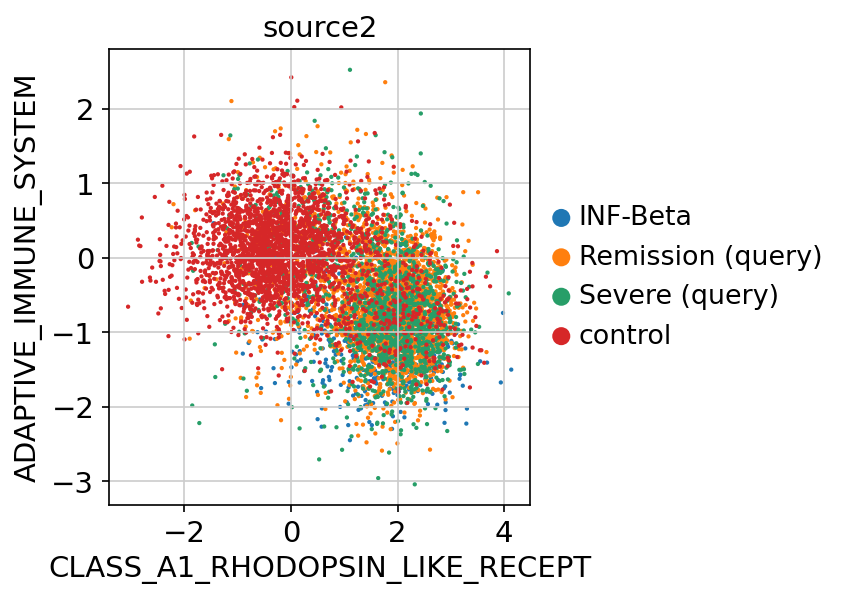

In [248]:
sc.pl.scatter(cd8t, x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="ADAPTIVE_IMMUNE_SYSTEM", 
              color='source2')

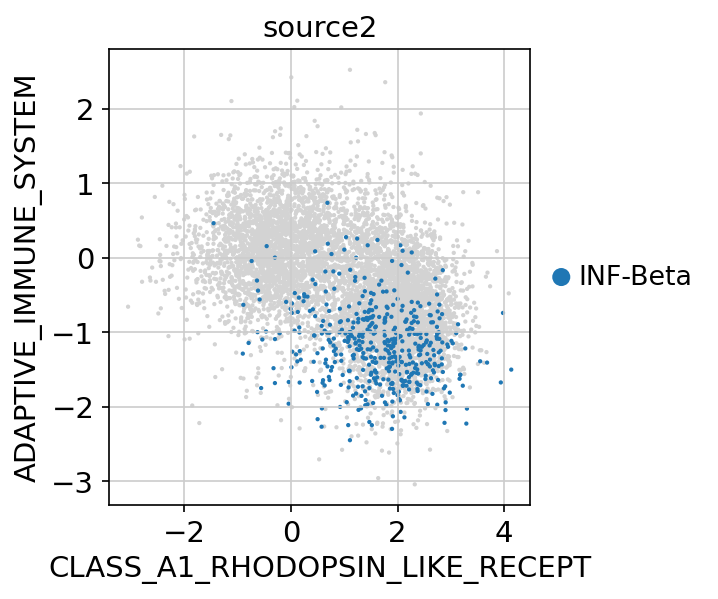

In [245]:
sc.pl.scatter(cd8t, x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="ADAPTIVE_IMMUNE_SYSTEM", 
              color='source2',groups=["INF-Beta"])

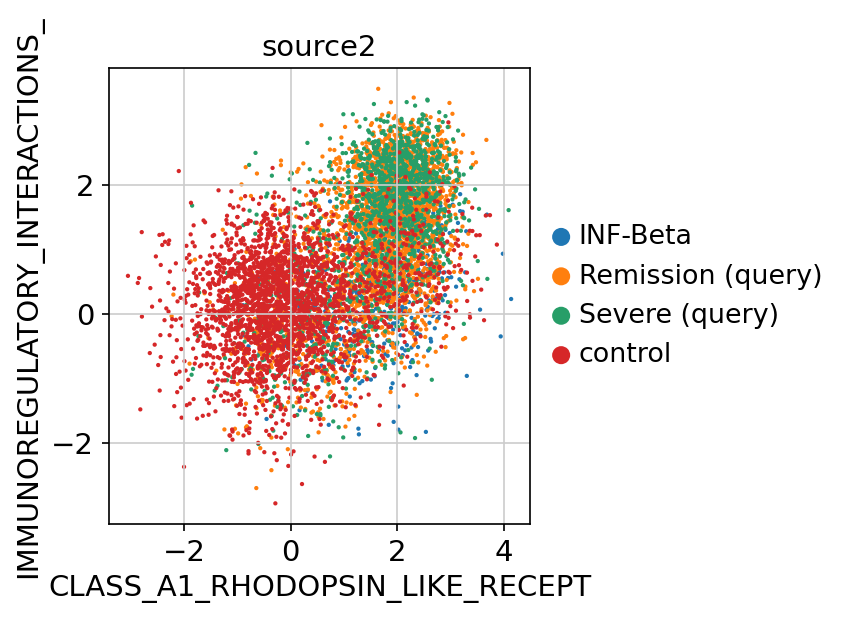

In [250]:
sc.pl.scatter(cd8t, x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="IMMUNOREGULATORY_INTERACTIONS_", 
              color='source2')

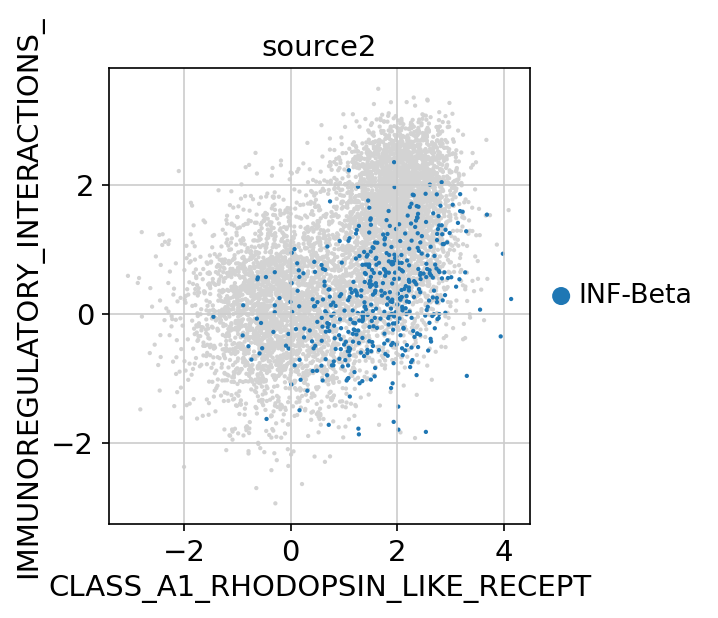

In [251]:
sc.pl.scatter(cd8t, x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="IMMUNOREGULATORY_INTERACTIONS_", 
              color='source2', groups=["INF-Beta"])

In [349]:
ct_pathway["CD8+ T cells"]["INF-Beta"]

{'terms': array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
        'ADAPTIVE_IMMUNE_SYSTEM', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'METABOLISM_OF_MRNA', 'GPCR_LIGAND_BINDING',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'METABOLISM_OF_RNA',
        'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CLASS_I_MHC_MEDIATED_ANTIGEN_P',
        'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_GPCR',
        'METABOLISM_OF_AMINO_ACIDS_AND_', 'GENERIC_TRANSCRIPTION_PATHWAY',
        'METABOLISM_OF_PROTEINS', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
        'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'MUSCLE_CONTRACTION',
        'DIABETES_PATHWAYS', 'GPCR_DOWNSTREAM_SIGNALING',
        'CELL_SURFACE_INTERACTIONS_AT_T', 'METABOLISM_OF_CARBOHYDRATES',
        'IMMUNE_SYSTEM', 'TCR_SIGNALING'], dtype=object),
 'scores': array([ 4.39,  4.25,  2.65,  1.86, -1.76, -1.54, -1.28, -1.28,  1.02,
        -1.01, -0.99,  0.94,  0.9 ,  0.85, -0.8 , -0.74, -0.67, -0.67,
         0.65, -0.64,  0.6 , -0.56,  0.52, -0.51])}

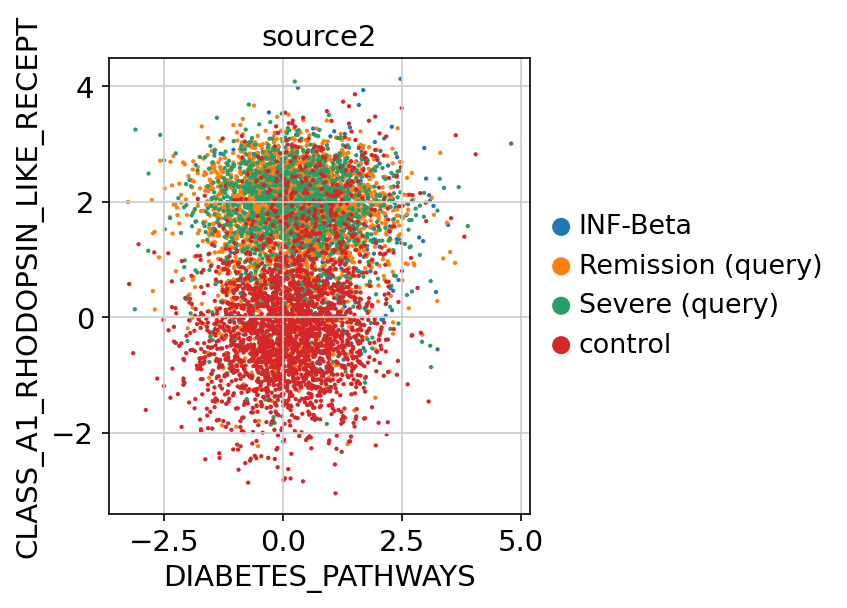

In [358]:
sc.pl.scatter(cd8t, x="DIABETES_PATHWAYS", y="CLASS_A1_RHODOPSIN_LIKE_RECEPT", 
              color='source2',)

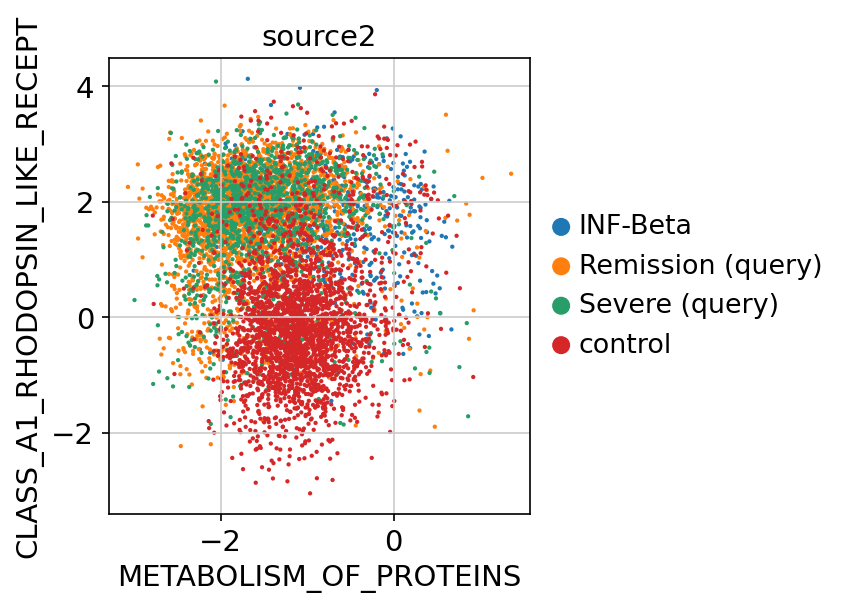

In [357]:
sc.pl.scatter(cd8t, x="METABOLISM_OF_PROTEINS", y="CLASS_A1_RHODOPSIN_LIKE_RECEPT", 
              color='source2',)

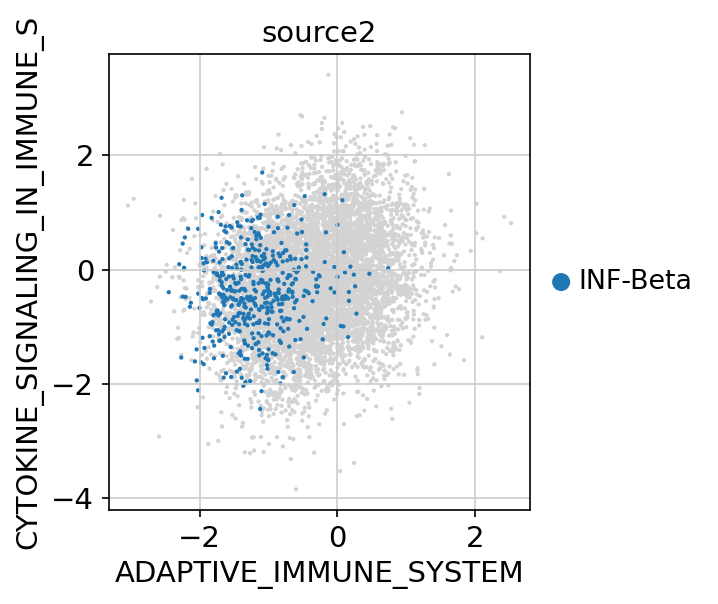

In [353]:
sc.pl.scatter(cd8t, x="ADAPTIVE_IMMUNE_SYSTEM", y="CYTOKINE_SIGNALING_IN_IMMUNE_S", 
              color='source2', groups=["INF-Beta"])

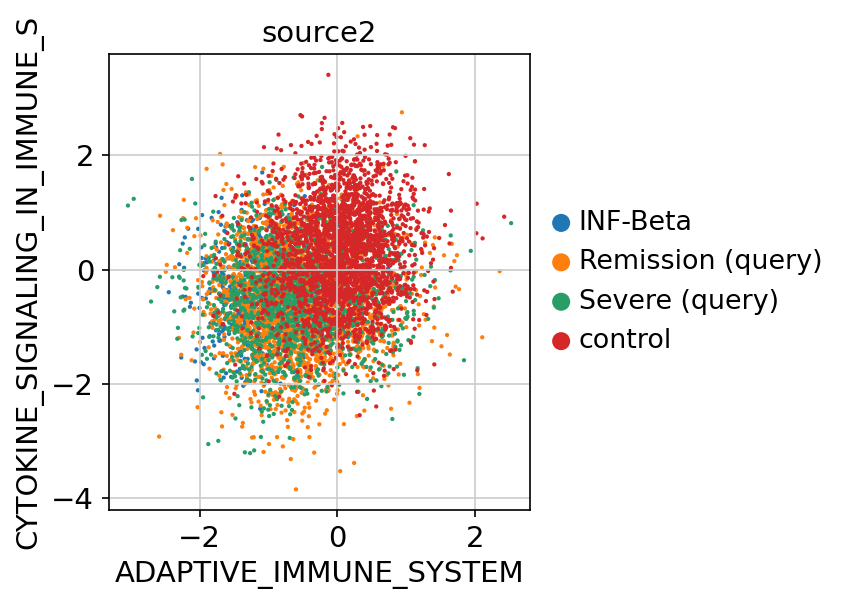

In [351]:
sc.pl.scatter(cd8t, x="ADAPTIVE_IMMUNE_SYSTEM", y="CYTOKINE_SIGNALING_IN_IMMUNE_S", 
              color='source2')

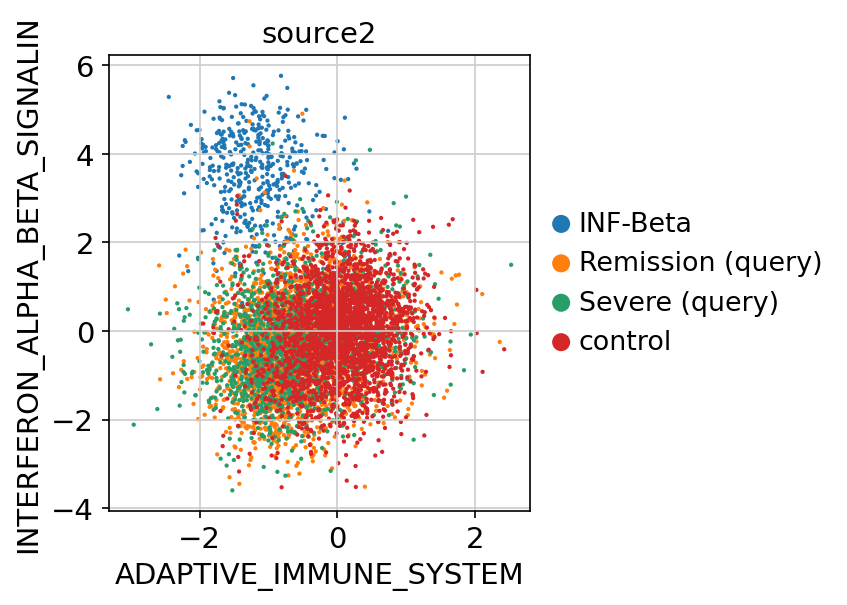

In [350]:
sc.pl.scatter(cd8t, x="ADAPTIVE_IMMUNE_SYSTEM", y="INTERFERON_ALPHA_BETA_SIGNALIN", 
              color='source2')

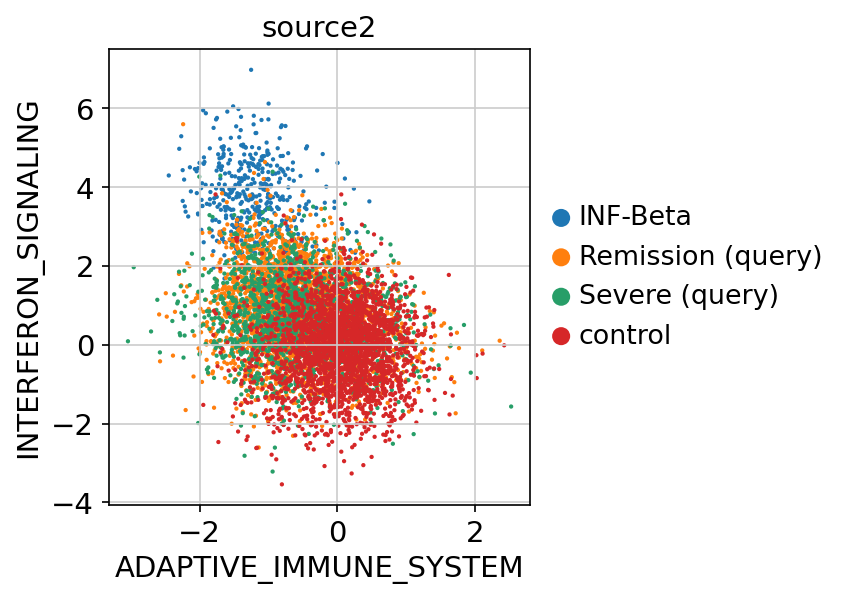

In [272]:
sc.pl.scatter(cd8t, x="ADAPTIVE_IMMUNE_SYSTEM", y="INTERFERON_SIGNALING", 
              color='source2')

In [347]:
model.terms_genes()['INTERFERON_SIGNALING']

['ISG15',
 'EIF4G3',
 'IFI6',
 'PTAFR',
 'JAK1',
 'GBP1',
 'GBP2',
 'GBP4',
 'GBP5',
 'FCGR1B',
 'FCGR1A',
 'ADAR',
 'EIF2AK2',
 'PPM1B',
 'RANBP2',
 'STAT1',
 'NUP210',
 'UBA7',
 'PRKCD',
 'EIF4E3',
 'KPNA1',
 'HERC5',
 'EIF4E',
 'CAMK2D',
 'IRF2',
 'IRF1',
 'EGR1',
 'IRF4',
 'HLA-F',
 'HLA-G',
 'HLA-A',
 'HLA-C',
 'HLA-B',
 'HLA-DRB5',
 'HLA-DRB1',
 'HLA-DQA1',
 'HLA-DQA2',
 'HLA-DPA1',
 'HLA-DPB1',
 'IFNGR1',
 'NUPL2',
 'IRF5',
 'NUP205',
 'JAK2',
 'DDX58',
 'NUP214',
 'IFITM2',
 'IFITM1',
 'IFITM3',
 'IRF7',
 'CD44',
 'NCAM1',
 'IFIT2',
 'IFIT3',
 'IFIT1',
 'PTPN6',
 'STAT2',
 'IFNG',
 'OAS1',
 'OAS3',
 'OAS2',
 'OASL',
 'IRF9',
 'IFI27',
 'B2M',
 'PIAS1',
 'ARIH1',
 'PML',
 'ISG20',
 'CIITA',
 'SOCS1',
 'MAPK3',
 'MT2A',
 'IRF8',
 'NUP88',
 'XAF1',
 'IFI35',
 'TRIM25',
 'KPNA2',
 'SOCS3',
 'EIF4A3',
 'PLCG1',
 'PTPN1',
 'ICAM1',
 'TYK2',
 'IRF3',
 'USP18',
 'NUP50',
 'IFNAR2',
 'IFNAR1',
 'IFNGR2',
 'MX2',
 'MX1']

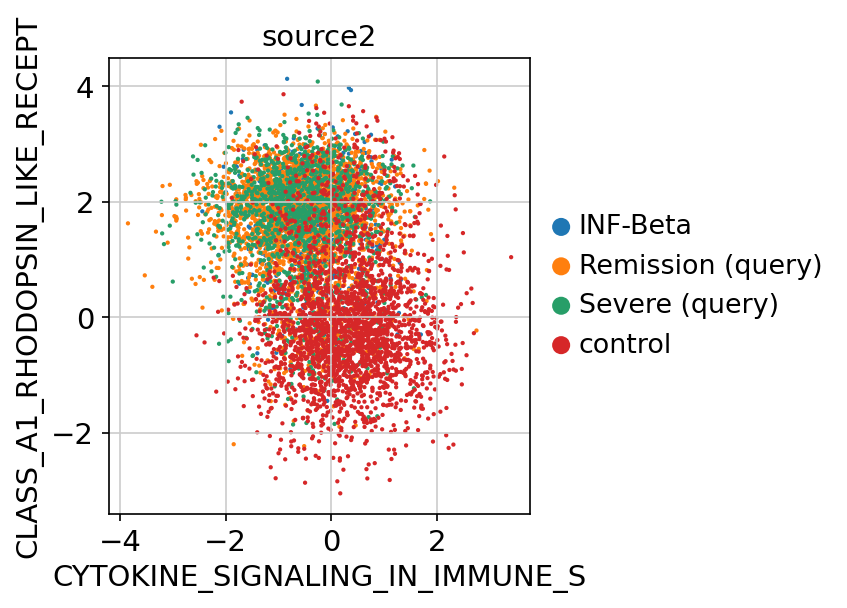

In [278]:
sc.pl.scatter(cd8t, x="CYTOKINE_SIGNALING_IN_IMMUNE_S", y="CLASS_A1_RHODOPSIN_LIKE_RECEPT", 
              color='source2')

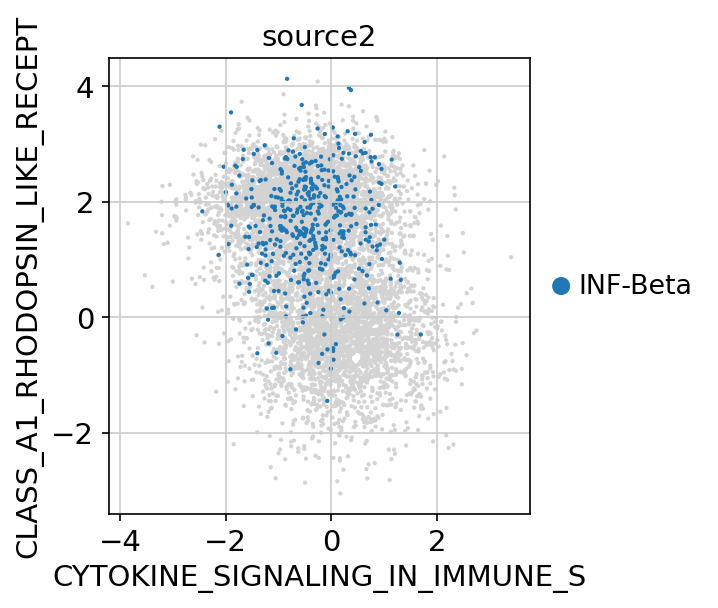

In [279]:
sc.pl.scatter(cd8t, x="CYTOKINE_SIGNALING_IN_IMMUNE_S", y="CLASS_A1_RHODOPSIN_LIKE_RECEPT", 
              color='source2', groups=["INF-Beta"])

# Erythrocite 

In [360]:
ct_pathway["Erythrocytes"]["Severe (query)"]["terms"]

array(['HEMOSTASIS', 'TRIF_MEDIATED_TLR3_SIGNALING',
       'SLC_MEDIATED_TRANSMEMBRANE_TRA', 'CELL_SURFACE_INTERACTIONS_AT_T',
       'METABOLISM_OF_MRNA', 'FACTORS_INVOLVED_IN_MEGAKARYOC',
       'APOPTOSIS', 'TOLL_RECEPTOR_CASCADES', 'MUSCLE_CONTRACTION',
       'SIGNALING_BY_TGF_BETA_RECEPTOR', 'CELL_CYCLE_MITOTIC',
       'DEVELOPMENTAL_BIOLOGY', 'CLASS_I_MHC_MEDIATED_ANTIGEN_P',
       'DIABETES_PATHWAYS', 'METABOLISM_OF_PROTEINS',
       'METABOLISM_OF_NUCLEOTIDES', 'GENERIC_TRANSCRIPTION_PATHWAY',
       'PLATELET_ACTIVATION_SIGNALING_', 'AXON_GUIDANCE',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CELL_CYCLE', 'AMYLOIDS',
       'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'TRANSCRIPTION',
       'FATTY_ACID_TRIACYLGLYCEROL_AND', 'SIGNALING_BY_RHO_GTPASES',
       'MEMBRANE_TRAFFICKING', 'IMMUNE_SYSTEM',
       'CLASS_A1_RHODOPSIN_LIKE_RECEPT', 'IMMUNOREGULATORY_INTERACTIONS_',
       'SIGNALING_BY_GPCR', 'GLYCOSAMINOGLYCAN_METABOLISM',
       'GPCR_DOWNSTREAM_SIGNALING'], dtype=object)

In [ ]:
sc.pl.scatter(cd8t, x="PLATELET_ACTIVATION_SIGNALING_", y="CLASS_I_MHC_MEDIATED_ANTIGEN_P", 
              color='source2')

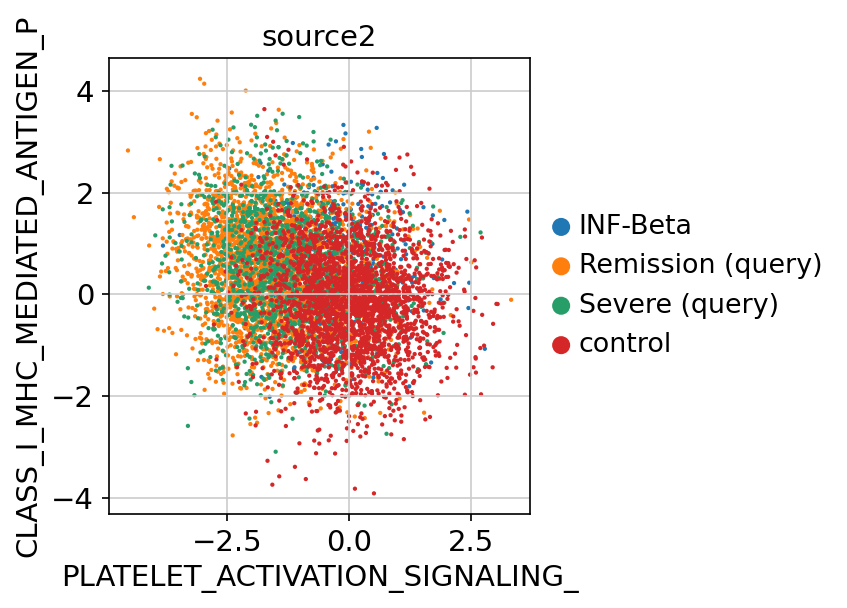

In [362]:
sc.pl.scatter(cd8t, x="PLATELET_ACTIVATION_SIGNALING_", y="CLASS_I_MHC_MEDIATED_ANTIGEN_P", 
              color='source2')

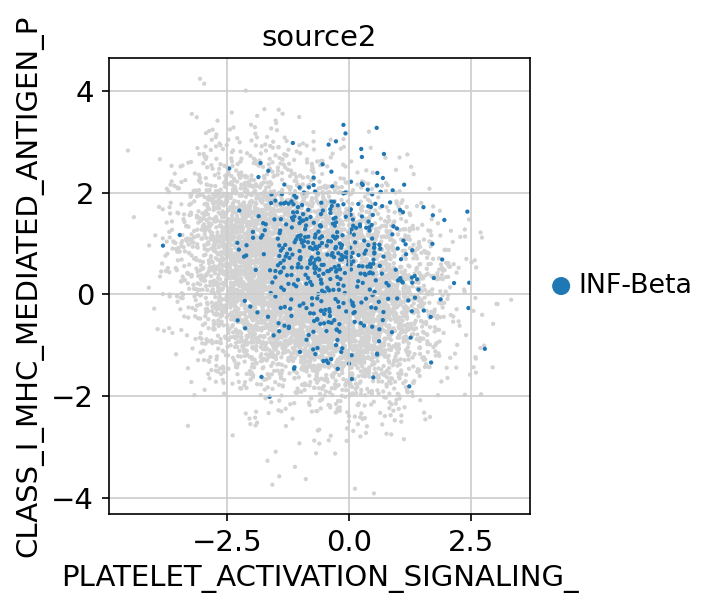

In [361]:
sc.pl.scatter(cd8t, x="PLATELET_ACTIVATION_SIGNALING_", y="CLASS_I_MHC_MEDIATED_ANTIGEN_P", 
              color='source2', groups=["INF-Beta"])

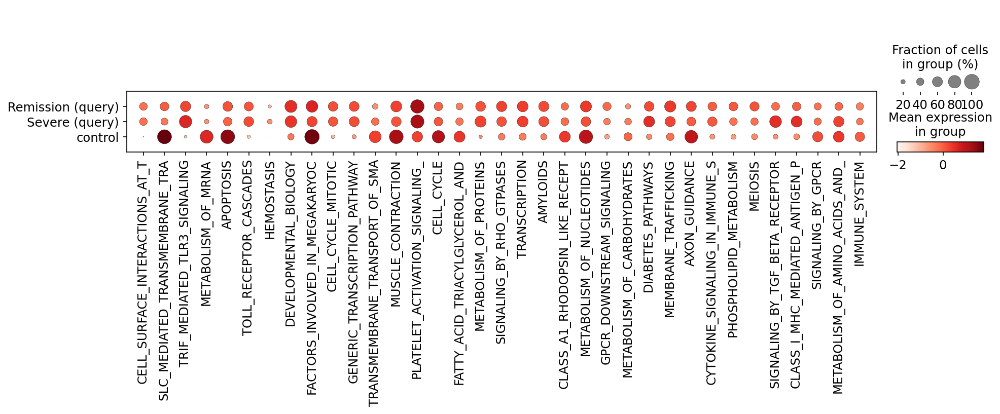

In [295]:
sc.pl.dotplot(ct_pathway_adata['Erythrocytes'], 
                     var_names=ct_pathway["Erythrocytes"]["Remission (query)"]["terms"]
                     ,groupby="source2")

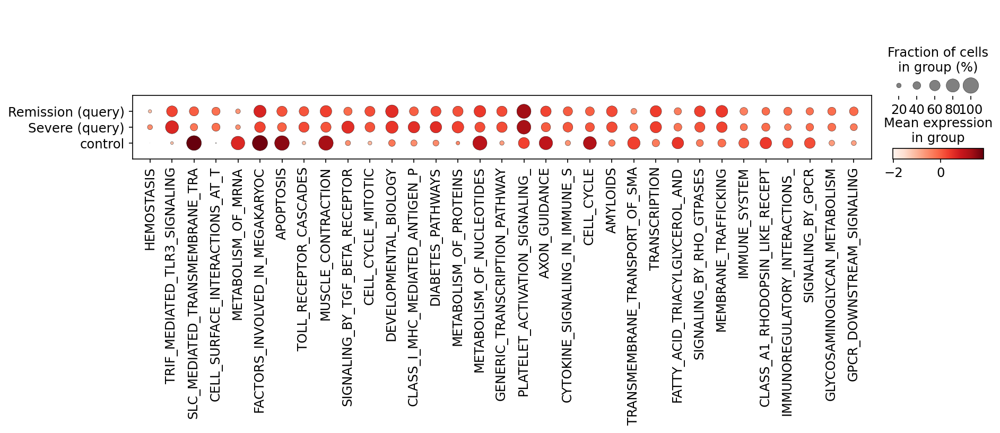

In [293]:
sc.pl.dotplot(ct_pathway_adata['Erythrocytes'], 
                     var_names=ct_pathway["Erythrocytes"]["Severe (query)"]["terms"]
                     ,groupby="source2")

### B cells

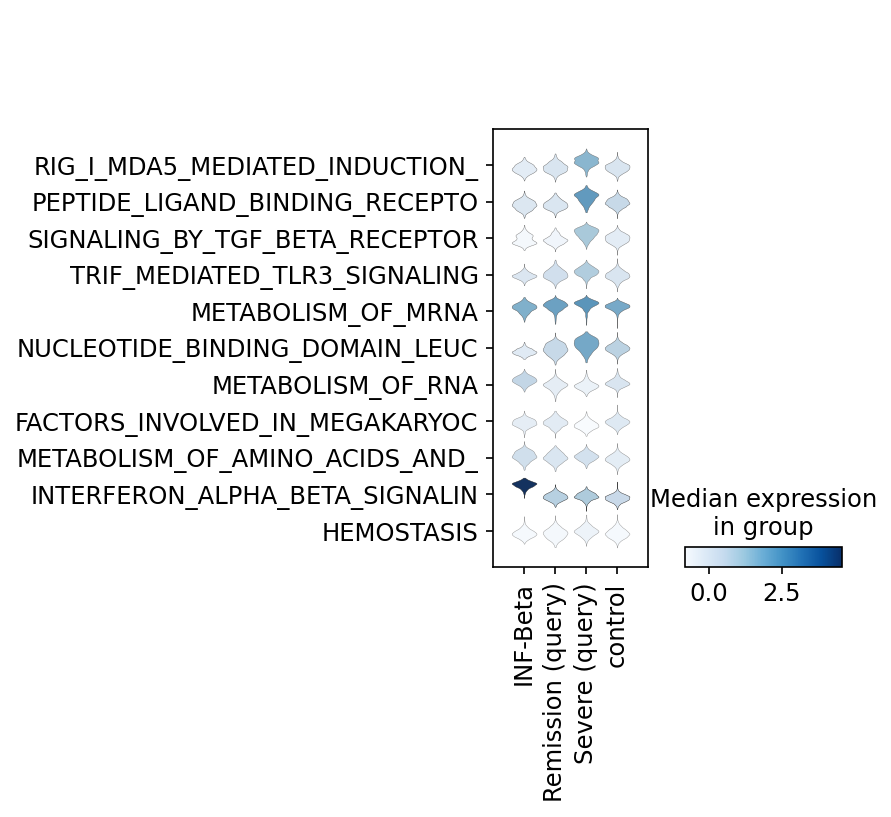

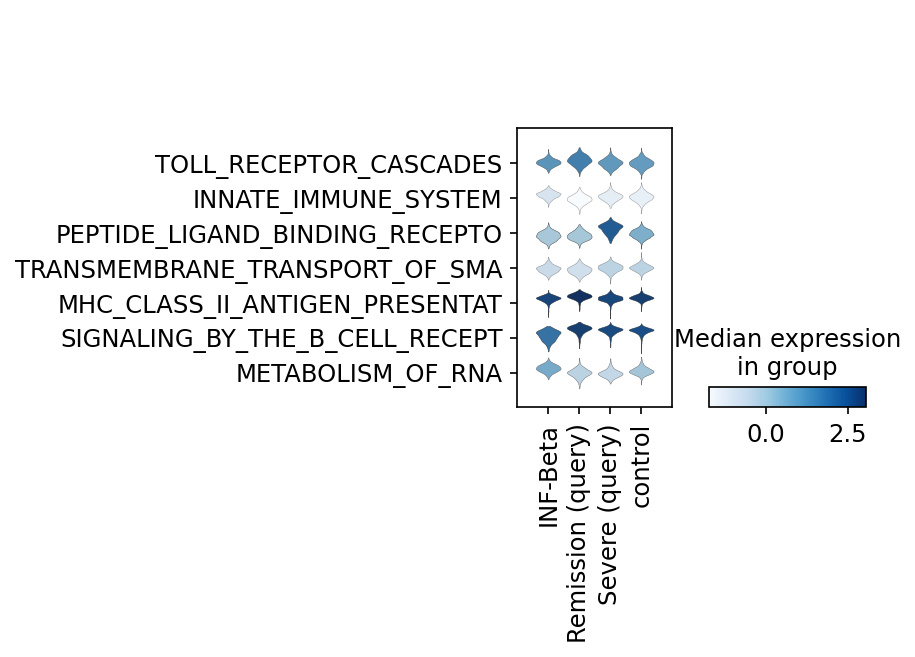

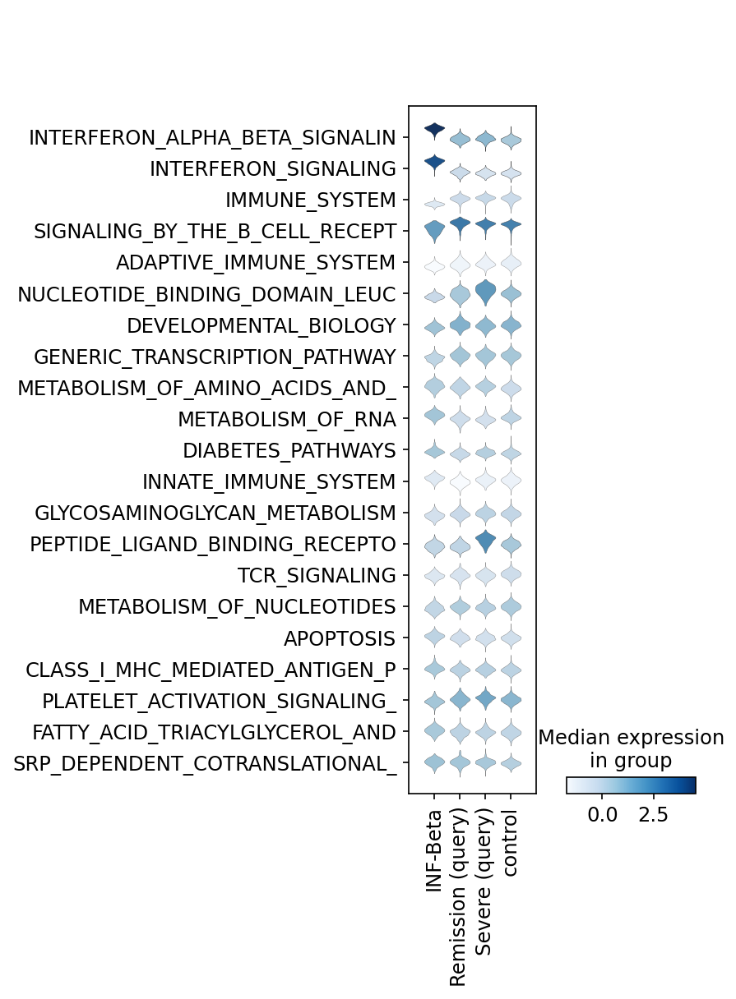

In [307]:
sc.pl.stacked_violin(ct_pathway_adata['B'], 
                     var_names=ct_pathway["B"]["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['B'], 
                     var_names=ct_pathway["B"]["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['B'], 
                     var_names=ct_pathway["B"]["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

## CD4T

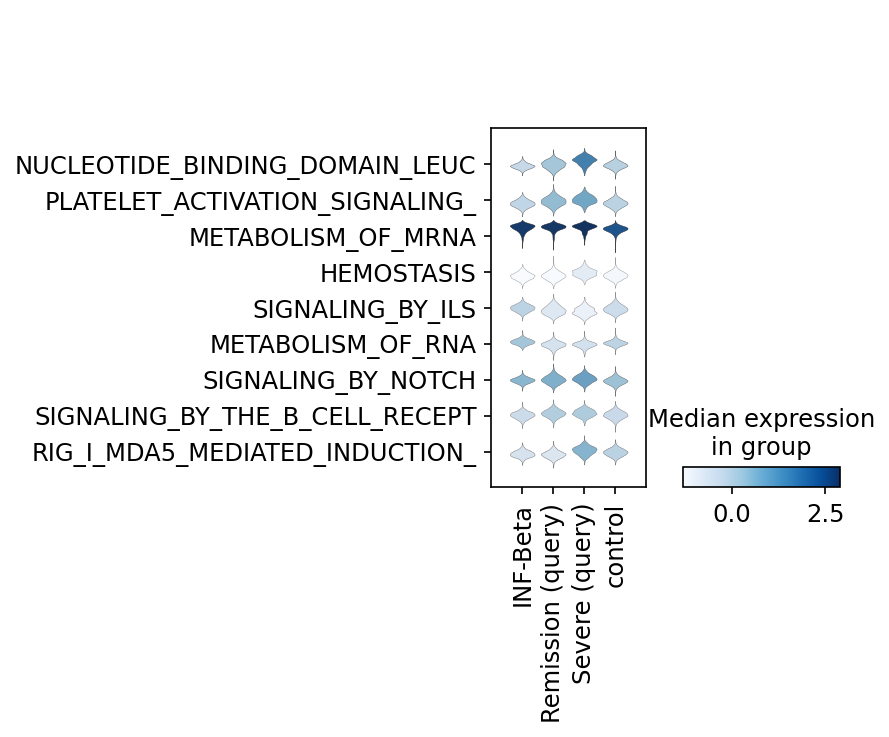

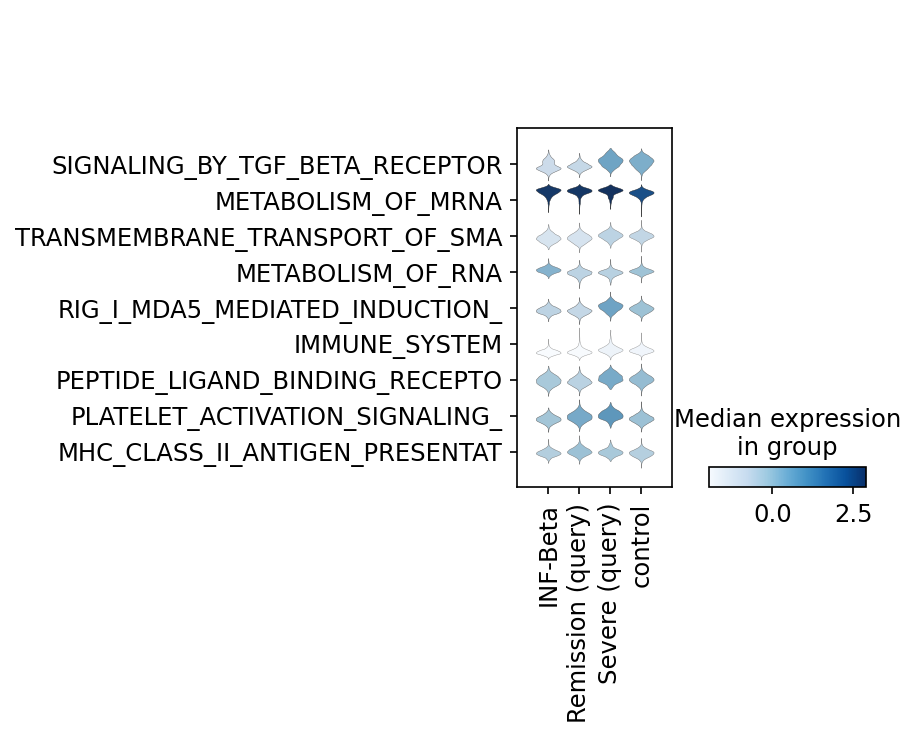

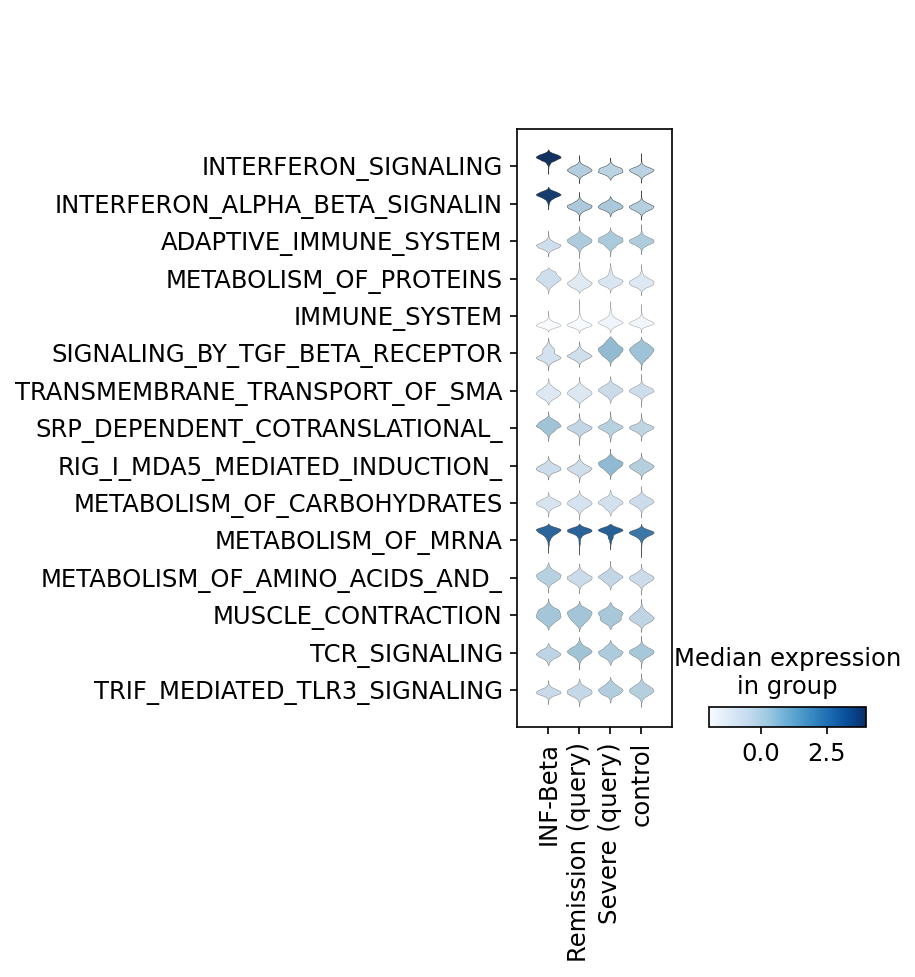

In [312]:
sc.pl.stacked_violin(ct_pathway_adata['CD4+ T cells'], 
                     var_names=ct_pathway['CD4+ T cells']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD4+ T cells'], 
                     var_names=ct_pathway['CD4+ T cells']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD4+ T cells'], 
                     var_names=ct_pathway['CD4+ T cells']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

NK

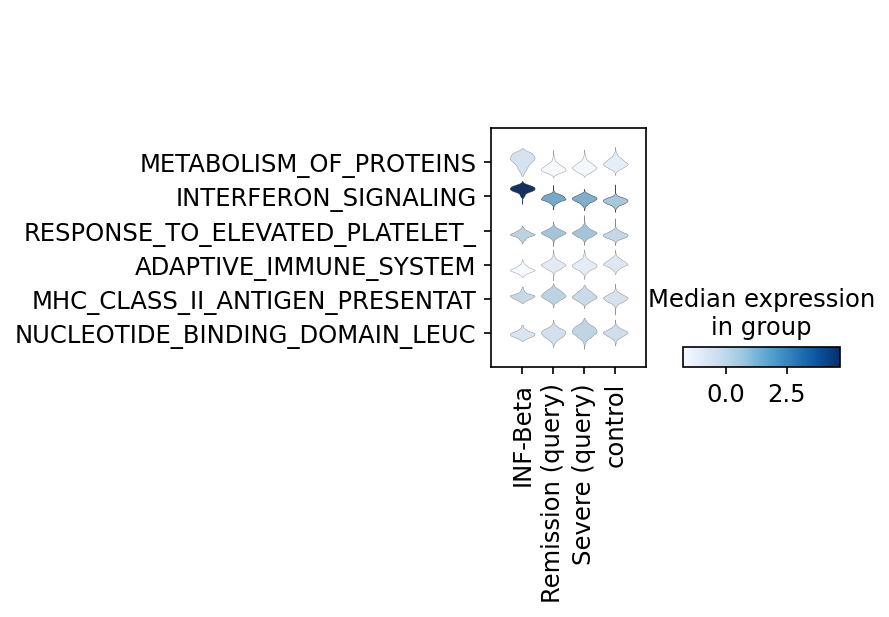

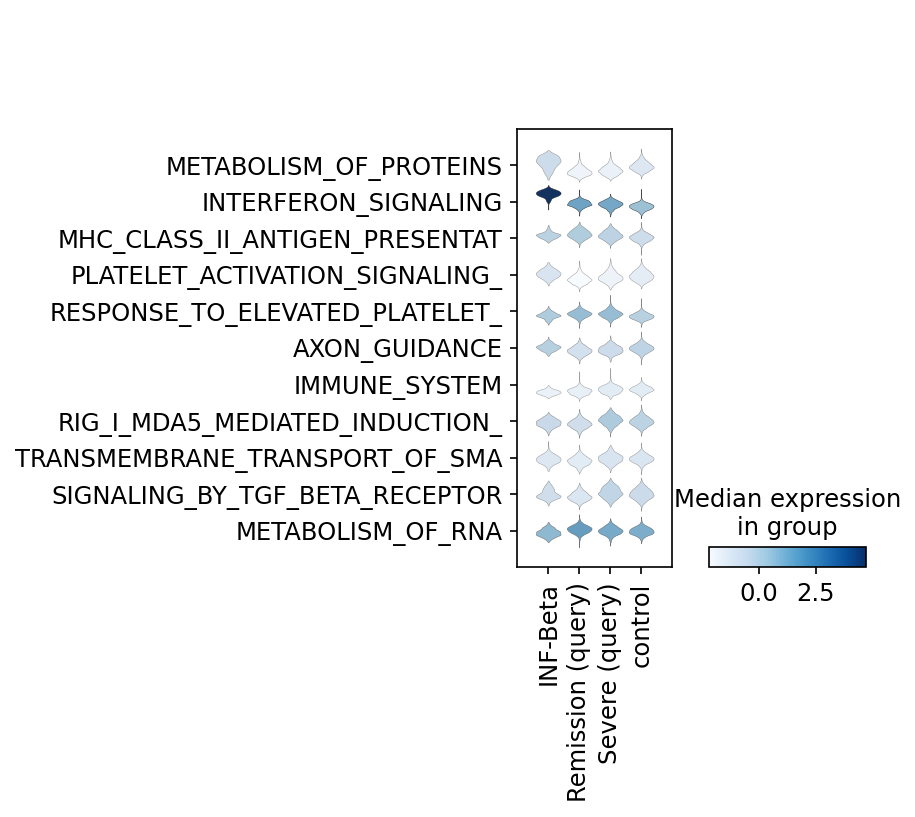

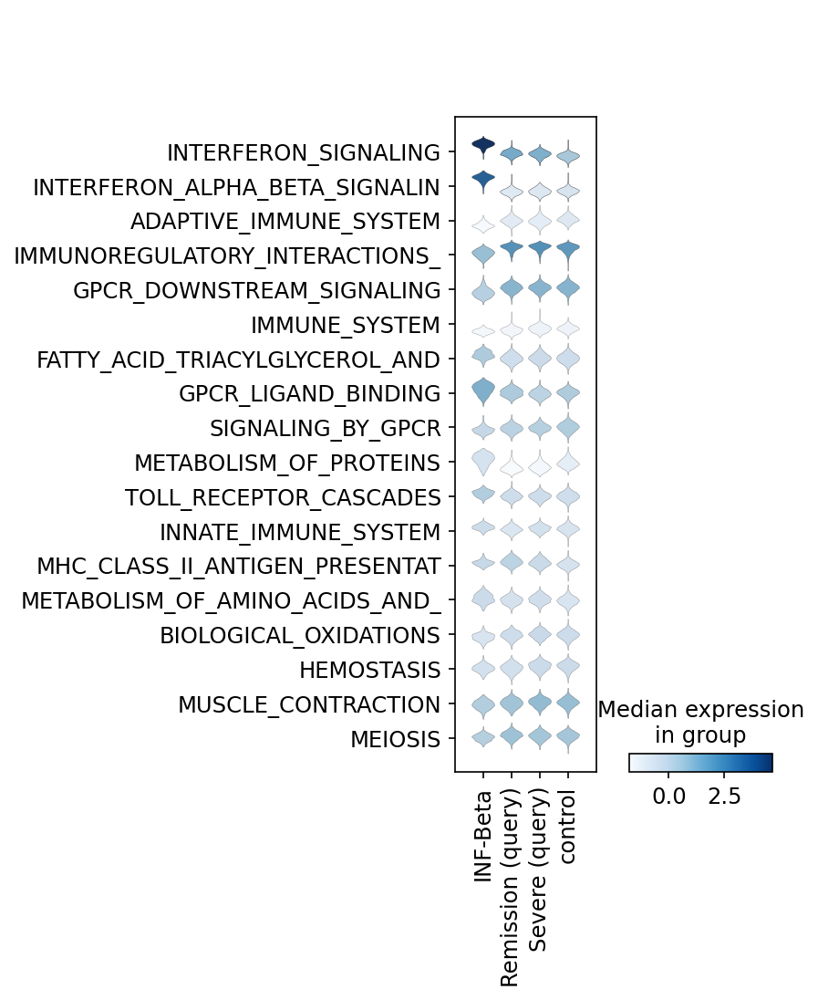

In [319]:
sc.pl.stacked_violin(ct_pathway_adata['NK cells'], 
                     var_names=ct_pathway['NK cells']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['NK cells'], 
                     var_names=ct_pathway['NK cells']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['NK cells'], 
                     var_names=ct_pathway['NK cells']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

In [363]:
ct_pathway['CD14+ Monocytes']["Severe (query)"]["terms"]

array(['RIG_I_MDA5_MEDIATED_INDUCTION_', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
       'METABOLISM_OF_MRNA', 'SIGNALING_BY_GPCR',
       'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'INTERFERON_SIGNALING',
       'MUSCLE_CONTRACTION', 'HEMOSTASIS',
       'PEPTIDE_LIGAND_BINDING_RECEPTO', 'CIRCADIAN_CLOCK',
       'METABOLISM_OF_AMINO_ACIDS_AND_', 'MHC_CLASS_II_ANTIGEN_PRESENTAT',
       'RESPONSE_TO_ELEVATED_PLATELET_', 'SRP_DEPENDENT_COTRANSLATIONAL_',
       'METABOLISM_OF_RNA', 'APOPTOSIS'], dtype=object)

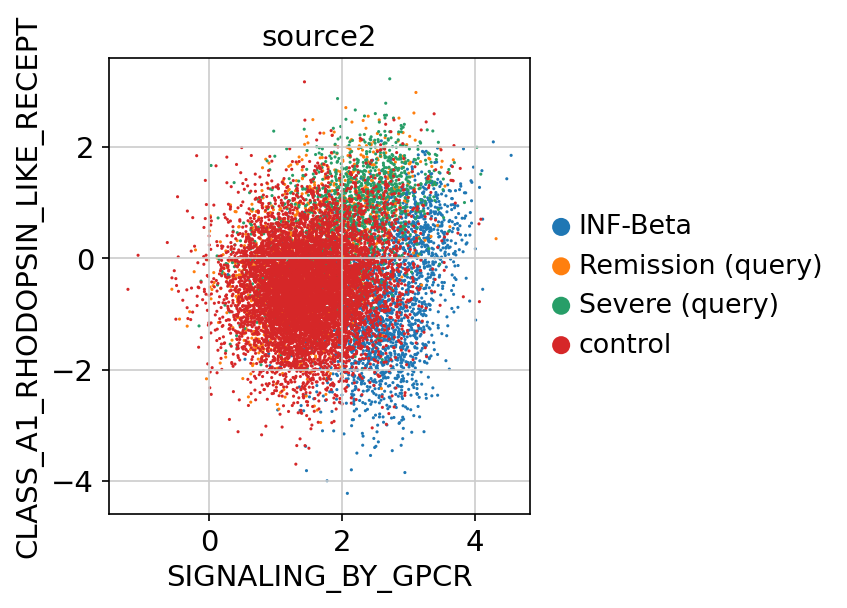

In [365]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="SIGNALING_BY_GPCR", 
              y="CLASS_A1_RHODOPSIN_LIKE_RECEPT", 
              color='source2')

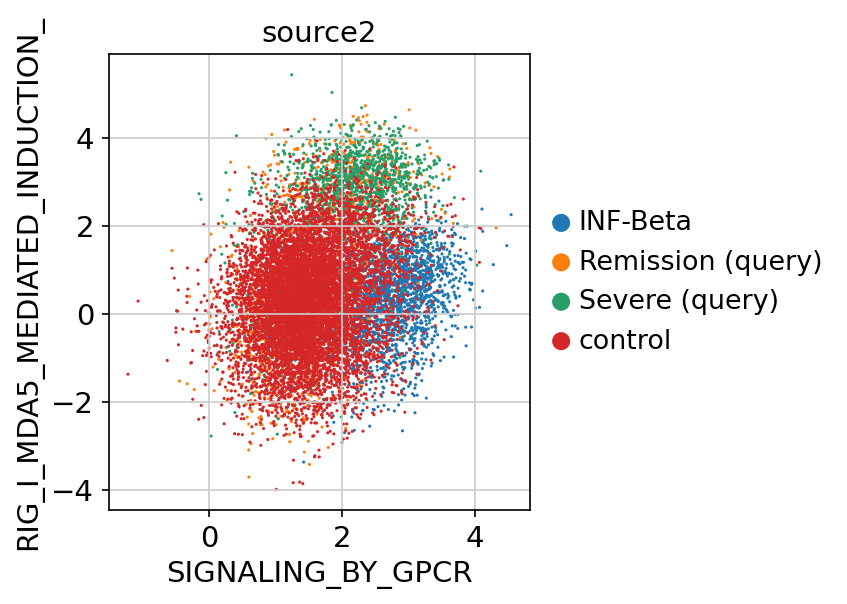

In [366]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="SIGNALING_BY_GPCR", 
              y="RIG_I_MDA5_MEDIATED_INDUCTION_", 
              color='source2')

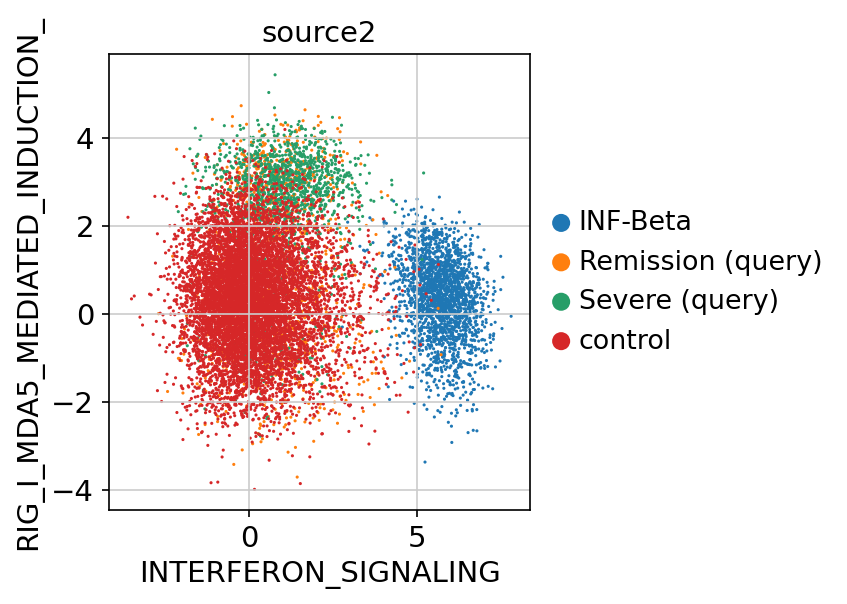

In [367]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="INTERFERON_SIGNALING", 
              y="RIG_I_MDA5_MEDIATED_INDUCTION_", 
              color='source2')

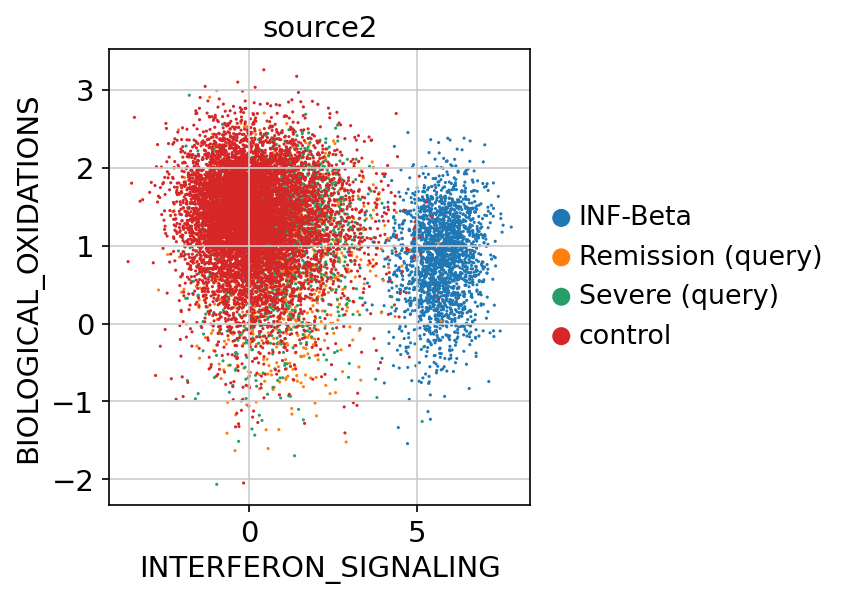

In [370]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="INTERFERON_SIGNALING", 
              y="BIOLOGICAL_OXIDATIONS", 
              color='source2')

In [368]:
ct_pathway['CD14+ Monocytes']["INF-Beta"]["terms"]

array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
       'GPCR_DOWNSTREAM_SIGNALING', 'METABOLISM_OF_CARBOHYDRATES',
       'IMMUNE_SYSTEM', 'SIGNALING_BY_GPCR',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'ADAPTIVE_IMMUNE_SYSTEM',
       'METABOLISM_OF_NUCLEOTIDES', 'METABOLISM_OF_AMINO_ACIDS_AND_',
       'METABOLISM_OF_RNA', 'SRP_DEPENDENT_COTRANSLATIONAL_', 'APOPTOSIS',
       'METABOLISM_OF_MRNA', 'PLATELET_ACTIVATION_SIGNALING_',
       'BIOLOGICAL_OXIDATIONS', 'FACTORS_INVOLVED_IN_MEGAKARYOC',
       'GENERIC_TRANSCRIPTION_PATHWAY', 'METABOLISM_OF_LIPIDS_AND_LIPOP',
       'MHC_CLASS_II_ANTIGEN_PRESENTAT', 'MUSCLE_CONTRACTION',
       'SLC_MEDIATED_TRANSMEMBRANE_TRA', 'AMYLOIDS',
       'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'SIGNALING_BY_NOTCH',
       'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'TCR_SIGNALING',
       'SIGNALING_BY_THE_B_CELL_RECEPT', 'AXON_GUIDANCE', 'TRANSCRIPTION',
       'INNATE_IMMUNE_SYSTEM', 'DEVELOPMENTAL_BIOLOGY',
       'CELL_SURFACE_INTERACTIONS_AT_T',

##  CD14+ Monocytes

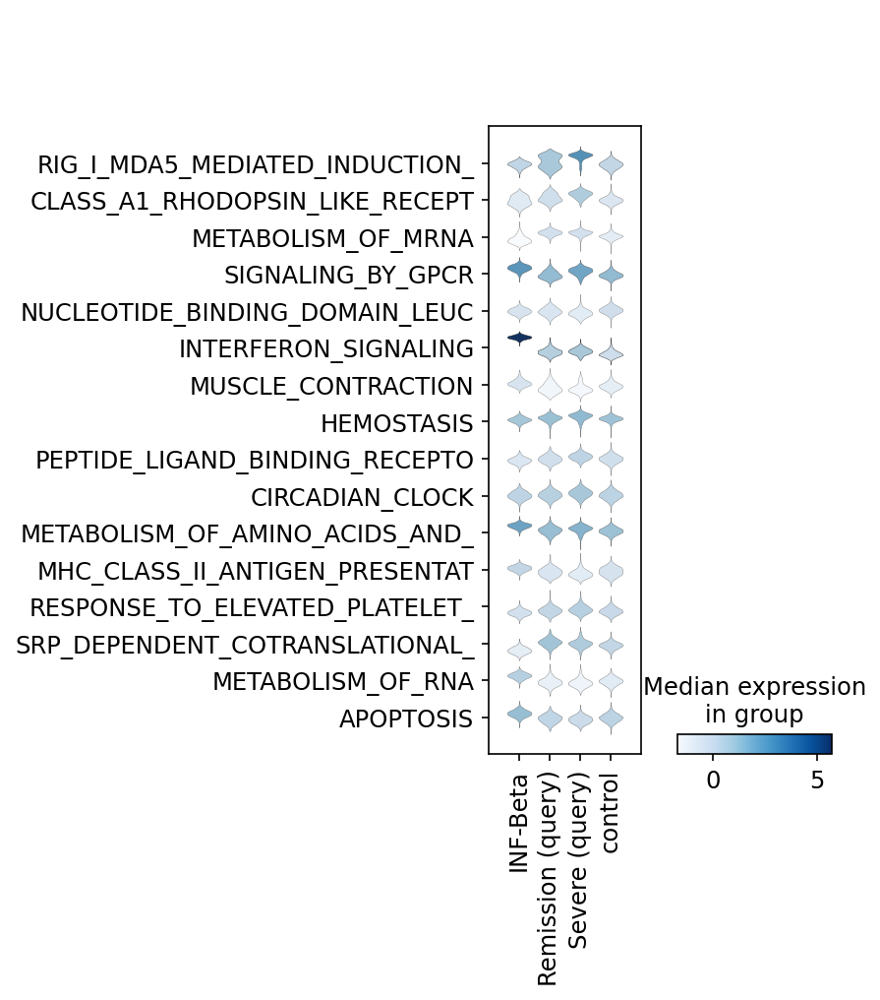

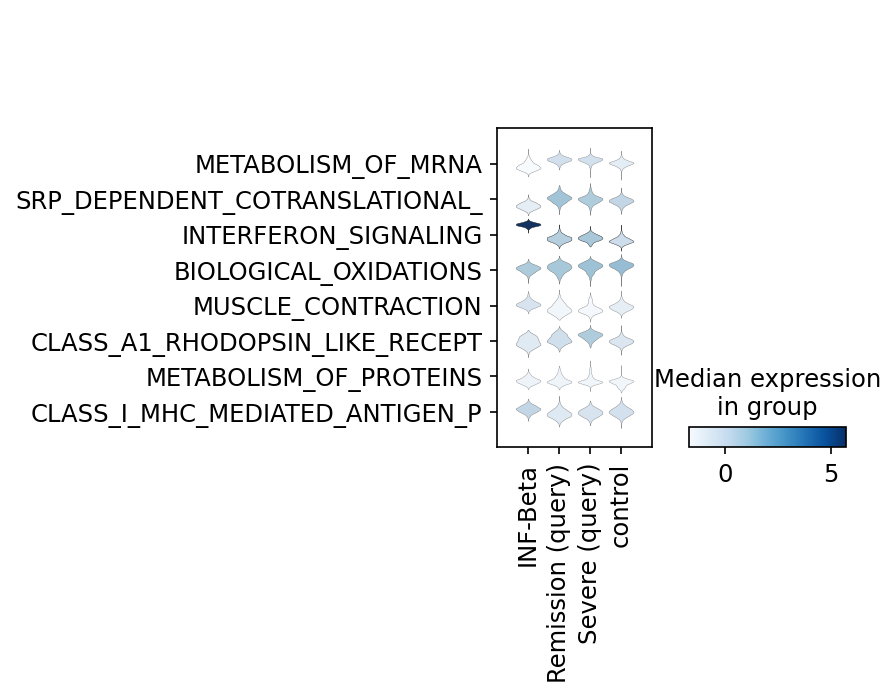

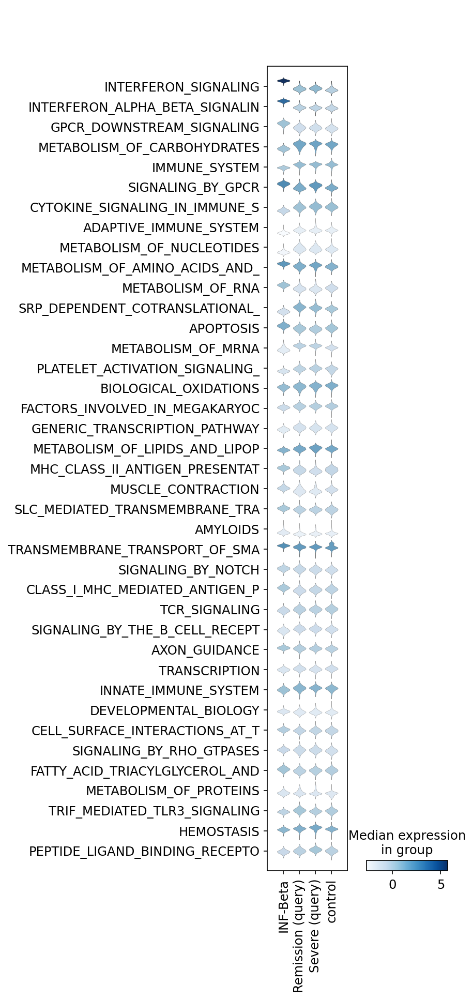

In [321]:
sc.pl.stacked_violin(ct_pathway_adata['CD14+ Monocytes'], 
                     var_names=ct_pathway['CD14+ Monocytes']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD14+ Monocytes'], 
                     var_names=ct_pathway['CD14+ Monocytes']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD14+ Monocytes'], 
                     var_names=ct_pathway['CD14+ Monocytes']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

###  CD16+ Monocytes

In [324]:
ct_pathway_adata['CD16+ Monocytes'].obs.source2.value_counts()

control              1332
INF-Beta              537
Remission (query)     126
Severe (query)         29
Name: source2, dtype: int64

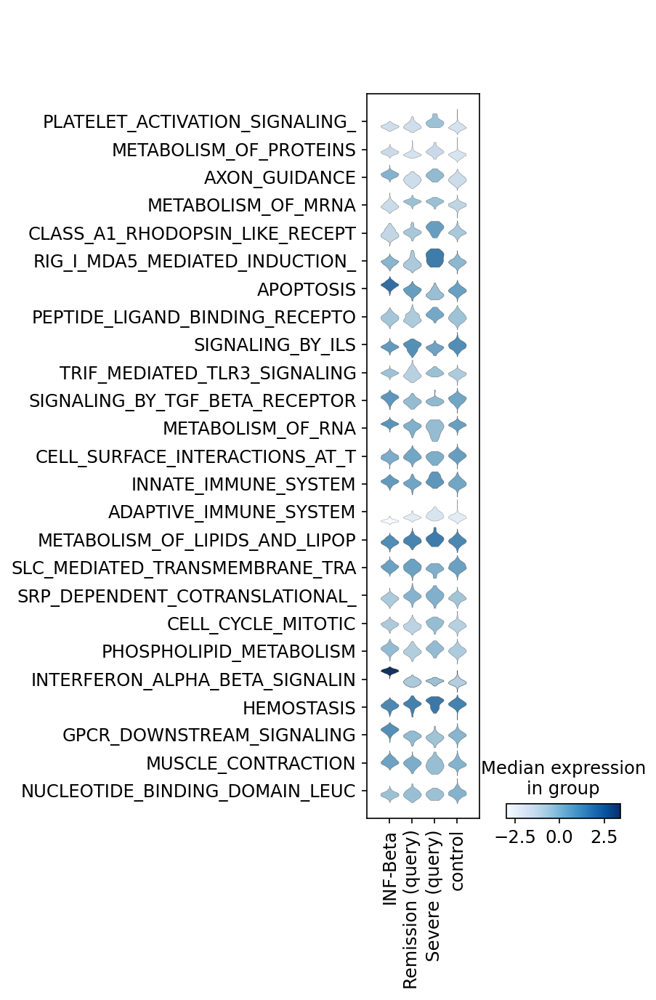

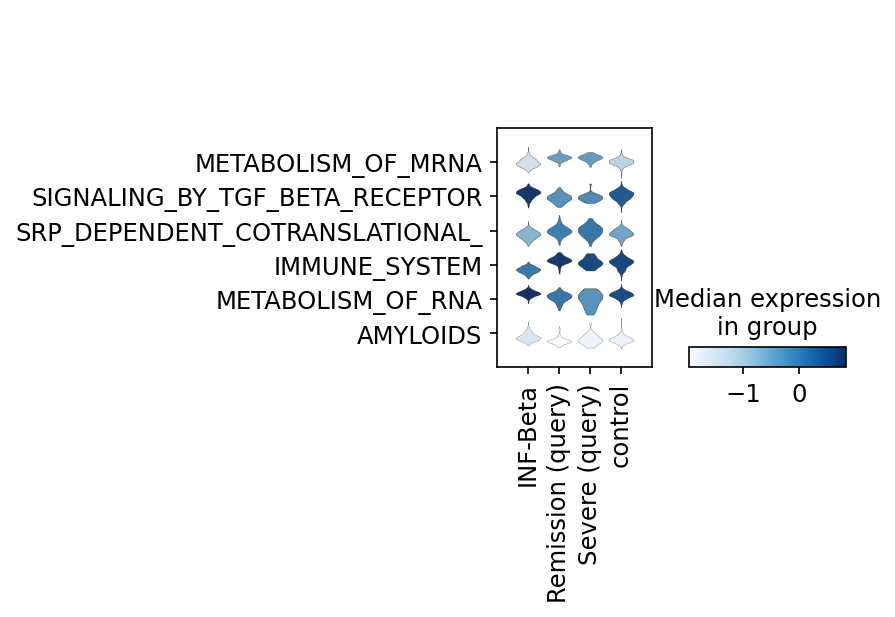

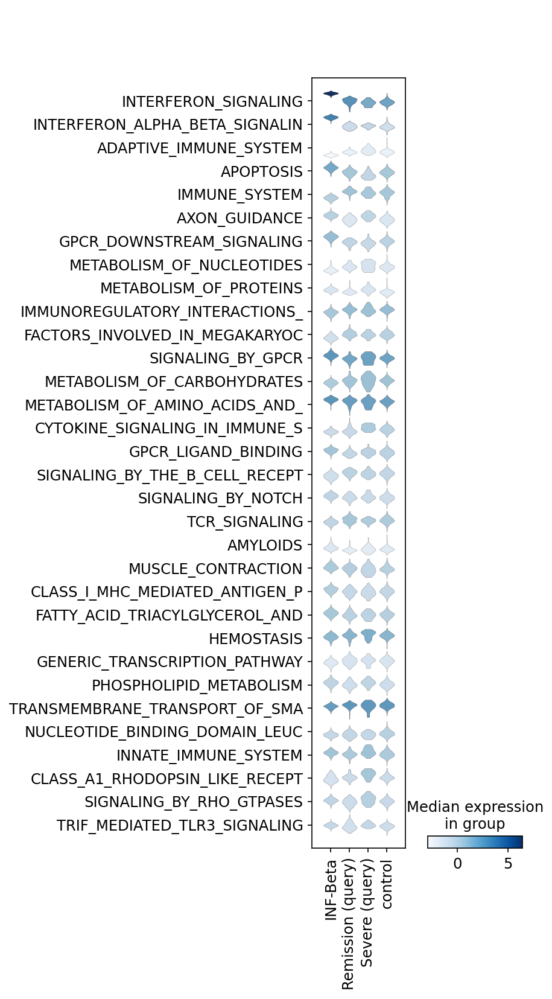

In [322]:
sc.pl.stacked_violin(ct_pathway_adata['CD16+ Monocytes'], 
                     var_names=ct_pathway['CD16+ Monocytes']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD16+ Monocytes'], 
                     var_names=ct_pathway['CD16+ Monocytes']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD16+ Monocytes'], 
                     var_names=ct_pathway['CD16+ Monocytes']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)